In [1]:
import re, PIL, urllib, owslib

from google.cloud import storage
client = storage.Client()

import cartopy.crs as ccrs
import cartopy.io.img_tiles as tiles
import cartopy.feature as cfeature
import cartopy.geodesic as cgeo
from datetime import datetime
from dateutil.relativedelta import relativedelta
import geopandas as gpd
from io import BytesIO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from matplotlib import patches
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.basemap import Basemap
import mysql.connector
import numpy as np
import pandas as pd
from owslib.wms import WebMapService
from PIL import Image

from functions_activityForValidation import *

maincolors = ['#2A9D8F','#e9c46a','#e76f51']


# Figure 1

0.020000000000000018
[0.0, 0.255, 0.51, 0.765] [0.0, 0.265, 0.51, 0.765]
[0.765, 1, 0.5, 0.48]


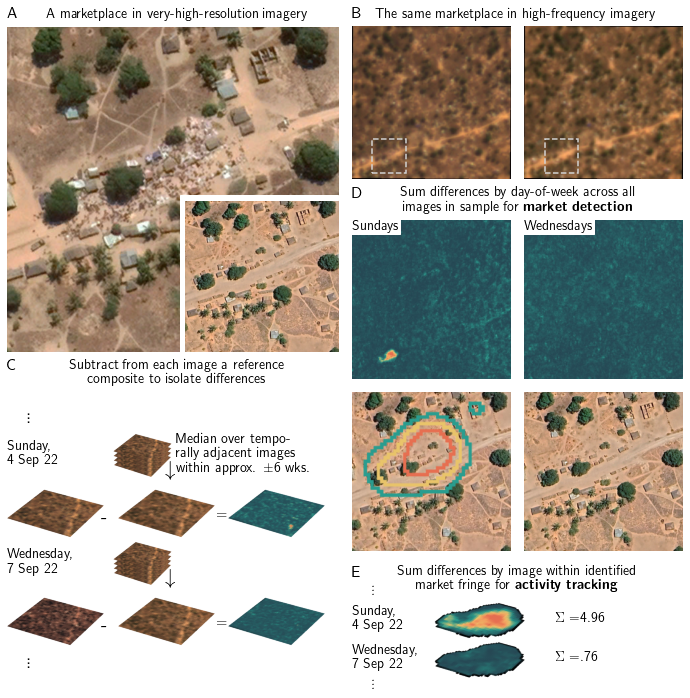

In [3]:
## Parameters ##
fontsize = 14 #4
fs_title=16
# Create a figure with specified dimensions
fig, ax = plt.subplots(figsize=(25/2.54, 25/2.54))  # Convert from cm to inches

image_paths = ["forFigures/fig1_mkt_highres.png", "forFigures/fig1_nomkt_highres.png", "forFigures/img2.jpeg", "forFigures/img4.jpeg"]
labels = ["Sun, 4 Sep 2022", "Wed, 25 Oct 2023", "Sun, 4 Sep 2022", "Wed, 7 Sep 2022"]
sizes = [.49,.235,.235,.235]
size=0.235
gap = (1- 4*.235)/3
print(gap)
x_corners = [i * (size + gap) for i in range(4)]
y_corners = [1-sizes[0]-gap,1-2*sizes[1]-2*gap,1-sizes[2]-gap,1-sizes[3]-gap]
labelcorners_pre =  [x_corners[0],x_corners[1]+gap/2, x_corners[2:4]]
labelcorners = [item for sublist in labelcorners_pre for item in (sublist if isinstance(sublist, list) else [sublist])]
print(x_corners, labelcorners)
c=-1
for labcorner, size, path, corner, label, y_corner in zip(labelcorners,sizes, image_paths, x_corners, labels,y_corners):
    c=c+1
    ax.imshow(plt.imread(path), extent=[corner, corner+size, y_corner, y_corner+size-0.01])
    if c==2 or c==3:
        rect = patches.Rectangle((corner+0.03, 1-size-0.01), 0.05, 0.05, linewidth=1.5, edgecolor='lightgrey', facecolor='none', linestyle='dashed')
        ax.add_patch(rect)
    if c==1:
        rect = patches.Rectangle((corner, y_corner), gap/3, 1*size-0.01, edgecolor='white', facecolor='white')
        ax.add_patch(rect)
        rect = patches.Rectangle((corner, y_corner+size-0.01), size,gap/3, edgecolor='white', facecolor='white')
        ax.add_patch(rect)
        
ax.annotate('A', xy=(x_corners[0], 1-gap), xycoords='axes fraction', va='bottom', ha='left', weight='bold', fontsize=fs_title)
ax.annotate('A marketplace in very-high-resolution imagery', xy=(.25, 1-gap), xycoords='axes fraction', va='bottom', ha='center', fontsize=fontsize)
ax.annotate('B', xy=(x_corners[2], 1-gap), xycoords='axes fraction', va='bottom', ha='left', weight='bold', fontsize=fs_title)
ax.annotate('The same marketplace in high-frequency imagery', xy=(.75, 1-gap), xycoords='axes fraction', va='bottom', ha='center', fontsize=fontsize)
top_y =1-size-1.5*gap
top_2 =1-sizes[0]-1.5*gap

ax.annotate('C', xy=(0, top_2), xycoords='axes fraction', va='top', ha='left',  fontweight='bold', fontsize=fs_title)

text = 'Subtract from each image a reference\ncomposite to isolate differences'
ax.annotate(text, xy=(0.25, top_2), xycoords='axes fraction', va='top', ha='center', fontsize=fontsize)

ax.set_facecolor('white')  # Set facecolor to white
ax.axis('off')
ax.set_xlim(0, 1), ax.set_ylim(0, 1)
for spine in ['top', 'right', 'bottom', 'left']:
    ax.spines[spine].set_visible(False)
ax.tick_params(left = False, right = False , labelleft = False , 
                labelbottom = False, bottom = False) 


images = ['diffWed.jpeg', 'fig1_nomkt_highres.png','diffSun.jpeg','contourLines.png']
c=-1
hgt_i=0.235
left_x = .5
right_x=1
bottom_y = .5
ax.annotate('Sum differences by day-of-week across all\nimages in sample for \\textbf{market detection}', 
                             xy=(1-hgt_i-gap/2,top_y), xycoords='data', va='top', ha='center', fontsize=fontsize)
key = 1-hgt_i-gap/2
top_3 =top_y-0.01
ax.imshow(plt.imread(f"forFigures/{images[2]}"), extent=[x_corners[2], x_corners[2]+hgt_i, top_3-2*gap-hgt_i, top_3-2*gap])
ax.imshow(plt.imread(f"forFigures/{images[0]}"), extent=[x_corners[3], 1, top_3-2*gap-hgt_i, top_3-2*gap])
ax.imshow(plt.imread(f"forFigures/{images[3]}"), extent=[x_corners[2], x_corners[2]+hgt_i, top_3-3*gap-2*hgt_i, top_3-3*gap-hgt_i])
ax.imshow(plt.imread(f"forFigures/{images[1]}"), extent=[x_corners[3], 1, top_3-3*gap-2*hgt_i, top_3-3*gap-hgt_i])
print([right_x-hgt_i, right_x, bottom_y, top_y-hgt_i-gap])
ax.annotate('Wednesdays', xy=(x_corners[3], top_3-2*gap), xycoords='data', va='top', ha='left', fontsize=fontsize,
            bbox=dict(facecolor='white', edgecolor='white', boxstyle='square,pad=0.1'))
ax.annotate('Sundays', xy=(x_corners[2],top_3-2*gap), xycoords='data', va='top', ha='left', fontsize=fontsize,
            bbox=dict(facecolor='white', edgecolor='white', boxstyle='square,pad=0.1'))
ax.annotate('D', xy=(x_corners[2],top_y), xycoords='axes fraction', va='top', ha='left',  fontweight='bold', fontsize=fs_title)


wid = (right_x-2*hgt_i-5*gap) /3  # Height of the plot to occupy (20%)
hei = .3 #image1.shape[1]/image1.shape[0]
siz = 0.05
up =.09
top_y-top_y/3
rows = [top_2-top_2*2/3-0.07, top_2-top_2/3-0.07] 
cols = [0, wid+gap, 2*wid+2*gap]
dates=["Wednesday,\n7 Sep 22", "Sunday,\n4 Sep 22"] #, "Wed, 8 Jun 22"]
cats =["img","comp","diff"]
count=0
for gg, (row, date) in enumerate(zip(rows, dates), start=0):
    ggg=gg+1
    g = row
    cc=-1
    for c in cols:
        count=count+1
        cc = cc+1
        subfig = plt.figure()
        subax = subfig.add_subplot(111, projection='3d')
        if cats[cc]=="comp":
            img = np.fliplr(np.array(Image.fromarray(plt.imread(f"forFigures/{cats[cc]}2.jpeg")).resize((50, 50)).rotate(270)))
        else:
            img = np.fliplr(np.array(Image.fromarray(plt.imread(f"forFigures/{cats[cc]}{ggg}.jpeg")).resize((50, 50)).rotate(270)))
            
        x = np.linspace(0, 1, img.shape[1])
        y = np.linspace(0, 1, img.shape[0])
        X, Y = np.meshgrid(x, y)
        subax.plot_surface(X, Y, np.ones_like(X), facecolors=img/255, rstride=1, cstride=1, shade=False)
        subax.tick_params(left = False, right = False , labelleft = False , 
                        labelbottom = False, bottom = False) 
        subax.set_xlim(0, 1), subax.set_ylim(0, 1), subax.set_zlim(0, 1)
        subax.grid(False), subax.set_axis_off()
        subax.set_xticks([]), subax.set_yticks([]), subax.set_zticks([])
        plt.savefig(f"forFigures/img{count}.png", transparent=True, bbox_inches='tight', pad_inches=0)    
        plt.close(subfig)
        subfig.clf()
        ax.imshow(mpimg.imread(f"forFigures/img{count}.png")[18:110, 15:205,:], extent=[c, c+wid, g-wid/4, g+wid/4])
        if c==0 and gg==1:
            ax.annotate("$\\vdots$", xy=(0.03, g+1.6*up), xycoords='axes fraction', va='center', ha='left', fontsize=20, fontweight='bold')
        if c==0 and gg==0:
            ax.annotate("$\\vdots$", xy=(0.03, g-1.5*wid/3), xycoords='axes fraction', va='bottom', ha='left', fontsize=20, fontweight='bold')
        
    ax.annotate('-', xy=(wid+gap-0.02, g), xycoords='axes fraction',
                             xytext=(wid+gap-0.02, g), va='center', ha='center', fontsize=20)
    ax.annotate('=', xy=(2*wid+1.5*gap, g), xycoords='axes fraction',
                             xytext=(2*wid+1.5*gap, g), va='center', ha='center', fontsize=15)
    
    
    desired_width = 50  # specify your desired width
    desired_height = 50  # specify your desired height
    image1_resized = np.fliplr(np.array(Image.fromarray(plt.imread(f"forFigures/img2.jpeg")).resize((desired_width, desired_height)).rotate(270)))

    # Create figure and 3D axis
    figComp = plt.figure()
    axComp = figComp.add_subplot(111, projection='3d')

    # Create grid
    x = np.linspace(0, 1, image1_resized.shape[1])
    y = np.linspace(0, 1, image1_resized.shape[0])
    X, Y = np.meshgrid(x, y)

    # Plot each image as a surface at different heights
    axComp.plot_surface(X, Y, np.ones_like(X), facecolors=image1_resized/255, rstride=1, cstride=1, shade=False)
    axComp.plot_surface(X, Y, 2 * np.ones_like(X), facecolors=image1_resized/255, rstride=1, cstride=1, shade=False)
    axComp.plot_surface(X, Y, 3 * np.ones_like(X), facecolors=image1_resized/255, rstride=1, cstride=1, shade=False)
    axComp.plot_surface(X, Y, 4 * np.ones_like(X), facecolors=image1_resized/255, rstride=1, cstride=1, shade=False)
    axComp.tick_params(left = False, right = False , labelleft = False , 
                    labelbottom = False, bottom = False) 

    axComp.set_xlim(0, 1), axComp.set_ylim(0, 1),  axComp.set_zlim(0, 6)
    axComp.grid(False),axComp.set_axis_off()
    axComp.set_xticks([]), axComp.set_yticks([]), axComp.set_zticks([])
    plt.savefig("forFigures/composite.png", transparent=True, bbox_inches='tight', pad_inches=0)
    plt.close(figComp)
    figComp.clf()

    ax.imshow(mpimg.imread('forFigures/composite.png'), extent=[1.25*wid+gap-siz, 1.25*wid+gap+siz, g+up-siz, g+up+siz])
    if gg!=1:
        #ax.annotate("$med()$", xy=(1.25*wid+gap+siz, g+up), xycoords='axes fraction',va='center', ha='left', fontsize=fontsize)
        pass
    else:
        text = "Median over tempo-\nrally adjacent images\nwithin approx. ±6 wks."
        ax.annotate(text, xy=(1.25*wid+gap+siz, g+up), xycoords='axes fraction', va='center', ha='left', fontsize=fontsize)
    ax.annotate("$\downarrow$", xy=(1.25*wid+gap+siz, g+up-siz/2), xycoords='axes fraction', va='center', ha='right', fontsize=21)
    ax.annotate(date, xy=(0, g+up), xycoords='axes fraction', va='center', ha='left', fontsize=fontsize)

top=top_y-4.5*gap-2*hgt_i
rows = [top*1/3-0.02, top*2/3-0.02]
wid=top/2
ax.annotate('E', xy=(right_x-2*hgt_i-gap,top), xycoords='axes fraction', va='top', ha='left',  fontweight='bold', fontsize=fs_title)
ax.annotate('Sum differences by image within identified\nmarket fringe for \\textbf{activity tracking}', 
                             xy=(key,top), xycoords='data', va='top', ha='center', fontsize=fontsize)

gg=-1
values=[[".54",".76",".68"],["5.32","4.96","5.08"]]#,["1.12",".78",".92"]]

colors = maincolors
for g in rows:
    gg=gg+1
    figComp = plt.figure()
    axComp = figComp.add_subplot(111, projection='3d')

    # Create grid
    x = np.linspace(0, 1, image1_resized.shape[1])
    y = np.linspace(0, 1, image1_resized.shape[0])
    X, Y = np.meshgrid(x, y)

    for r in range(2,3):
        image1_resized = np.fliplr(np.array(Image.fromarray(plt.imread(f"forFigures/row{gg}_shape{r}.jpeg")).resize((desired_width, desired_height)).rotate(180)))
        image_rgba = np.zeros((image1_resized.shape[0], image1_resized.shape[1], 4), dtype=np.uint8)
        image_rgba[:, :, :3] = image1_resized  # Copy RGB channels
        image_rgba[:, :, 3] = 255  # Set alpha channel to opaque initially
        black_pixels = (image_rgba[:, :, 0] == 0) & (image_rgba[:, :, 1] == 0) & (image_rgba[:, :, 2] == 0)
        image_rgba[:, :, 3][black_pixels] = 0
        axComp.plot_surface(X, Y, r *np.ones_like(X), facecolors=image_rgba/255, rstride=1, cstride=1, shade=False)
    axComp.tick_params(left = False, right = False , labelleft = False , 
                    labelbottom = False, bottom = False) 

    # Set axis limits
    axComp.set_xlim(0, 1), axComp.set_ylim(0, 1), axComp.set_zlim(0, 3)
    axComp.grid(False)
    axComp.set_xticks([]), axComp.set_yticks([]), axComp.set_zticks([])
    axComp.set_axis_off()
    plt.savefig(f"forFigures/stack_row{gg}.png", transparent=True, bbox_inches='tight', pad_inches=0)    

    plt.close(figComp)
    figComp.clf()
    ax.imshow(mpimg.imread(f"forFigures/stack_row{gg}.png"), extent=[.585, 0.585+2.5*wid, g-2.5*wid/2-0.02, g+2.5*wid/2-0.02])

    xcoor=.81
    ycoor_anchor=g
    rowsize=0.02
    for v in range(1,2):
        ycoor = -rowsize+ycoor_anchor+v*rowsize
        string = ax.annotate(f"$\Sigma=${values[gg][v]}", xy=(xcoor, ycoor), xycoords='axes fraction', va='center', ha='left', fontsize=fontsize, color='black')#colors[v]
    if gg==1:
        ax.annotate("$\\vdots$", xy=(right_x-2*hgt_i-gap+0.03, g+0.04), xycoords='axes fraction', va='center', ha='left', fontsize=15, fontweight='bold')    
    ax.annotate(dates[gg], xy=(right_x-2*hgt_i-gap, g), xycoords='axes fraction', va='center', ha='left', fontsize=fontsize, fontweight='bold')     
ax.annotate("$\\vdots$", xy=(right_x-2*hgt_i-gap+0.03, top*1/3-0.06), xycoords='axes fraction', va='center', ha='left', fontsize=15, fontweight='bold')    

plt.rcParams['text.usetex'] = True  # Enable LaTeX
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig(f"forFigures/Figure1.png", transparent=True, bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()

plt.close(fig)
fig.clf()

# Figure 2
'The following cell interacts with our database and can therefore not be run in the replication package.'
'The code is shown here for transparency.'


31
loc lon40_7055lat-14_2118
lon40_7055lat-14_2118 p170mozambique0 170_Mozambique
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
loc lon40_5858lat-13_9452
lon40_5858lat-13_9452 p170mozambique0 170_Mozambique
[29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17]
loc lon40_467lat-15_2152
lon40_467lat-15_2152 p170mozambique3 170_Mozambique
[30, 29, 28, 27, 26, 25, 24, 23, 22, 21]
loc lon40_4542lat-14_067
lon40_4542lat-14_067 p170mozambique0 170_Mozambique
[18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
loc lon40_4403lat-15_3881
lon40_4403lat-15_3881 p170mozambique3 170_Mozambique
[28, 27, 26]
loc lon40_4315lat-14_3459
lon40_4315lat-14_3459 p170mozambique0 170_Mozambique
[29, 21, 20, 19, 18, 17, 28, 27, 26, 25, 24, 23, 22, 16]
loc lon40_4299lat-13_957
lon40_4299lat-13_957 p170mozambique0 170_Mozambique
[23]
loc lon40_4157lat-14_4235
lon40_4157lat-14_4235 p170mozambique0 170_Mozambique
[29, 28, 27, 26, 25, 24, 23, 22, 21]
loc lon40_4133lat-13_6573
lon40_4133lat-13_6573 p170mozambique0

,loc,thres,detected_days,detected_days_simul,country,weekdays,valid
0,lon40_7055lat-14_2118,8,[],[],Mozambique,[0],0
1,lon40_7055lat-14_2118,9,[],[],Mozambique,[0],0
2,lon40_7055lat-14_2118,10,[],[],Mozambique,[0],0
3,lon40_7055lat-14_2118,11,[],[],Mozambique,[0],0
4,lon40_7055lat-14_2118,12,[],[],Mozambique,[0],0
5,lon40_7055lat-14_2118,13,[],[],Mozambique,[0],0
6,lon40_7055lat-14_2118,14,[],[],Mozambique,[0],0
7,lon40_7055lat-14_2118,15,[],[],Mozambique,[0],0
8,lon40_7055lat-14_2118,16,[0],[],Mozambique,[0],1
9,lon40_7055lat-14_2118,17,[0],[],Mozambique,[0],1


,loc,thres,detected_days,detected_days_simul,country,weekdays,valid,precision,recall,fpr
0,lon40_7055lat-14_2118,8,[],[],Mozambique,[0],0,[],[0],0
1,lon40_7055lat-14_2118,9,[],[],Mozambique,[0],0,[],[0],0
2,lon40_7055lat-14_2118,10,[],[],Mozambique,[0],0,[],[0],0
3,lon40_7055lat-14_2118,11,[],[],Mozambique,[0],0,[],[0],0
4,lon40_7055lat-14_2118,12,[],[],Mozambique,[0],0,[],[0],0
5,lon40_7055lat-14_2118,13,[],[],Mozambique,[0],0,[],[0],0
6,lon40_7055lat-14_2118,14,[],[],Mozambique,[0],0,[],[0],0
7,lon40_7055lat-14_2118,15,[],[],Mozambique,[0],0,[],[0],0
8,lon40_7055lat-14_2118,16,[0],[],Mozambique,[0],1,[1],[1],0
9,lon40_7055lat-14_2118,17,[0],[],Mozambique,[0],1,[1],[1],0


60
31
48


,country,thres,precision
0,Kenya,8,1.000000
1,Kenya,9,1.000000
2,Kenya,10,1.000000
3,Kenya,11,1.000000
4,Kenya,12,1.000000
...,...,...,...
64,Mozambique,26,0.790698
65,Mozambique,27,0.705882
66,Mozambique,28,0.627119
67,Mozambique,29,0.563380


,country,thres,recall
0,Kenya,8,0.150685
1,Kenya,9,0.178082
2,Kenya,10,0.205479
3,Kenya,11,0.315068
4,Kenya,12,0.369863
...,...,...,...
64,Mozambique,26,0.666667
65,Mozambique,27,0.705882
66,Mozambique,28,0.725490
67,Mozambique,29,0.784314


,thres,cutoffs_orig_log
0,0,2.772589e+00
1,1,2.671317e+00
2,2,2.567416e+00
3,3,2.460743e+00
4,4,2.351147e+00
5,5,2.238463e+00
6,6,2.122513e+00
7,7,2.003101e+00
8,8,1.880015e+00
9,9,1.753020e+00


,country,thres,valid,precision,recall,fpr,cutoffs_orig_log
0,Kenya,8,0.183333,1.000000,0.150685,0.000000,1.880015e+00
1,Malawi,8,0.000000,NaN,0.000000,0.000000,1.880015e+00
2,Mozambique,8,0.104167,1.000000,0.098039,0.000000,1.880015e+00
3,Kenya,9,0.216667,1.000000,0.178082,0.000000,1.753020e+00
4,Malawi,9,0.000000,NaN,0.000000,0.000000,1.753020e+00
5,Mozambique,9,0.166667,1.000000,0.156863,0.000000,1.753020e+00
6,Kenya,10,0.250000,1.000000,0.205479,0.000000,1.621860e+00
7,Malawi,10,0.000000,NaN,0.000000,0.000000,1.621860e+00
8,Mozambique,10,0.187500,1.000000,0.176471,0.000000,1.621860e+00
9,Kenya,11,0.366667,1.000000,0.315068,0.000000,1.486254e+00


['Kenya', 'Malawi', 'Mozambique'] [' (60 markets)', ' (31)', ' (48)']


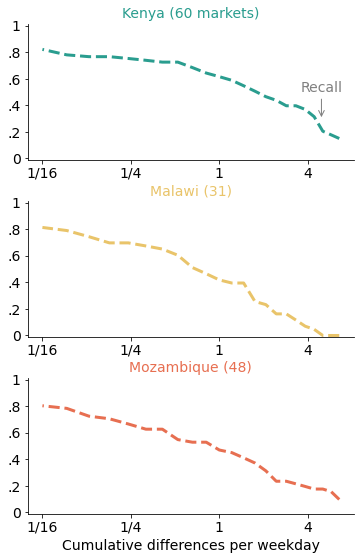

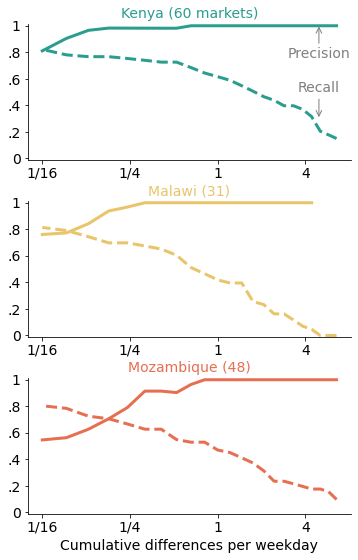

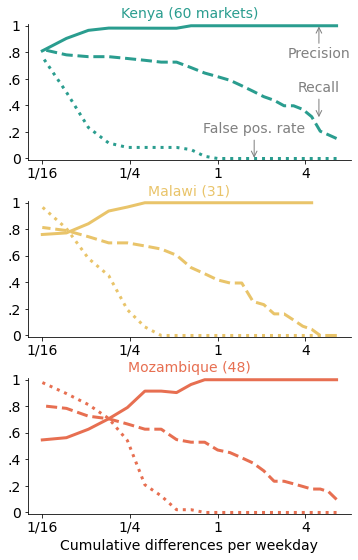

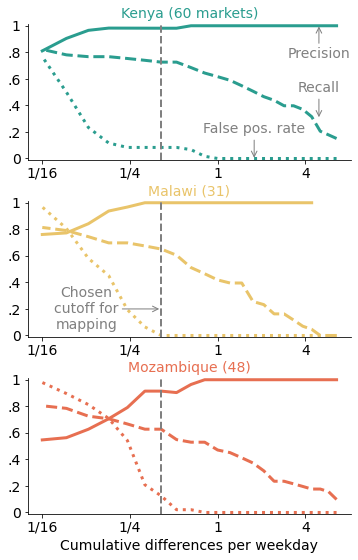

,country,thres,valid,precision,recall,fpr,cutoffs_orig_log
48,Kenya,24,0.750000,0.981481,0.726027,0.083333,-0.892574
49,Malawi,24,0.709677,1.000000,0.651163,0.000000,-0.892574
50,Mozambique,24,0.645833,0.914286,0.627451,0.125000,-0.892574


country
Kenya         0.800000
Malawi        0.774194
Mozambique    0.645833
Name: valid, dtype: float64

In [2]:
# Create list of detected days for various threshold levels

freqDayStr_short='w7'
maxRank = 4 # exclude altitude levels above this
ring_area_share = 0.8  # Only consider rings whose area is more than 100(1-X)% of the shape defining the outer border of the ring

prefix = "exports-mai2023"
varsOfInterest=['p50','sumsum', 'ccount']
threshold_for_market=24
bucket=client.get_bucket('exports-mai2023')

forMerge=['ident','weekdayThisAreaIsActive','date','mktDay','mktID','locGroup','time','year','month', 'weekday', 'mkt_lat','mkt_lon','time_decimal'] 
patterns_to_drop = ['ground_control','strictnessRank', 'subStrictnessRank''Geography','origName_', 'coorLength_', '.geo', 'system:index_b0', 'system:index', 'weekday_','market']
propToDrop=['quality_category','system:index', '.geo','order_id', 'pixel_resolution','gsd','provider', 'published', 'publishing_stage', 'item_type', 'item_id', 'snow_ice_percent', 'strip_id','updated']

list_df_acrossLocs = []
pd.set_option('display.width', 100)  # Set display width
pd.set_option('display.max_columns', 500)  # Show all columns

df1 = pd.read_csv('forFigures/malawi_validationMarkets.csv')
df1['country'] = 'Malawi'
df1.loc[df1['loc'] == 'lon35_0148lat-16_2', 'weekdays'] = "2,6" # based on visual inspection
df1.loc[df1['loc'] == 'lon35_3223lat-15_6801', 'weekdays'] = "3,0,6" 
df1.loc[df1['loc'] == 'lon34_8547lat-15_4476', 'weekdays'] = "2,6" 

df2 = pd.read_csv('forFigures/kenya_validationMarkets.csv')
df2['country'] = 'Kenya'
df2.loc[df2['loc'] == 'lon1_0312lat34_9975', 'weekdays'] = "2,0" # based on visual inspection
df2.loc[df2['loc'] == 'lon0_4892lat34_8373', 'weekdays'] = "1" 

df3 = pd.read_csv('forFigures/mozambique_validationMarkets.csv')
df3['country'] = 'Mozambique'
remove= ['lon40_6945lat-14_8443','lon39_5196lat-14_0691', 'lon40_5215lat-14_3051'] # only opened in 2023
df3.loc[df3['loc'] == 'lon39_2759lat-15_1246', 'weekdays'] = '0' # based on visual inspection
df3.loc[df3['loc'] == 'lon38_0526lat-16_9714', 'weekdays'] = '2'
df3.loc[df3['loc'] == 'lon39_1221lat-15_0092', 'weekdays'] = '0'
df3 = df3[~df3['loc'].isin(remove)].reset_index(drop=True)

df_validation = pd.concat([df1, df2,df3], ignore_index=True)
df_validation = df_validation[['loc', 'country', 'weekdays']]
df_validation = df_validation.dropna(subset=['weekdays'])
df_validation = df_validation.dropna(subset=['loc']).reset_index(drop=True)
df_validation['weekdays'] = df_validation['weekdays'].str.replace(' ', ',')
df_validation['weekdays'] = df_validation['weekdays'].str.replace(',,', ',')

print(len(df_validation[df_validation['country']=='Malawi']['loc'].unique()))

locs = df_validation['loc'].unique()

## no exports because no shape detected with pipeline
no_shapes = ["lon-0_3438lat34_8801",'lon0_3355lat34_6492','lon0_5214lat34_7107']
no_shapes_simul = ['lon0_2067lat34_4904','lon0_1971lat34_6969','lon0_3355lat34_6492','lon39_1221lat-15_0092',
                   'lon0_4413lat34_7168','lon35_6374lat-15_8082','lon0_7281lat34_8767','lon0_6563lat34_5907',
                   'lon0_6511lat34_8766','lon0_604lat34_8756','lon0_5364lat34_4999','lon0_4845lat34_7496',
                   'lon0_471lat34_315','lon0_4218lat34_4254','lon0_3816lat34_5842','lon0_3606lat34_4016'
                  ]
# no export because "Computation timed out error" 
no_03export=['lon35_4511lat-14_362','a']

def check_file_exists(bucket, file_path):
    """Check if a file exists in a Google Cloud Storage bucket."""
    blob = bucket.blob(file_path)
    return blob.exists()
results_df = pd.DataFrame(columns=['loc', 'thres','detected_days','detected_days_simul'])
results_df = results_df.astype('object')
locsProb=['']
locCount=0

for exportType in ['Act5','Actval']:
    for loc in sorted(locs, reverse=True):
        print('loc', loc)
        locCount=locCount+1
        # Get the GEEbucket and locGroup for the current location
        GEEbucket = checkLocationFileStatus(loc, 'bucket')
        locGroup = checkLocationFileStatus(loc, 'locGroup')
        print(loc, GEEbucket, locGroup)

        # Read the activity CSV file
        if exportType=='Act5' and (loc in no_shapes or loc in no_03export): 
            for t in range(8,31):
                temp_df = pd.DataFrame({'loc': [loc], 'thres': [t], 'detected_days': [[]]})
                results_df = pd.concat([results_df, temp_df], ignore_index=True)
        elif exportType=='Actval' and (loc in no_shapes_simul):
            for t in range(8,31):
                results_df.loc[(results_df['loc'] == loc) & (results_df['thres'] == t), 'detected_days_simul'] = ''
        else:
            df = pd.read_csv(f'gs://exports-mai2023/{locGroup}/measures/export{exportType}_maxpMax{loc}_{freqDayStr_short}.csv')

            # keep only entries that fall between the strictest rank we define and the least strict one for a given shape, but at least 30
            minRank = max(df['strictnessRank'].min(),30)
            df = df[(df['strictnessRank'] <= minRank) & (df['strictnessRank'] >= maxRank)]
            df = df[((df['subStrictnessRank'] <= minRank) & (df['subStrictnessRank'] > maxRank)) | (pd.isna(df['subStrictnessRank'])) | (df['subStrictnessRank'] ==100) ]
            print(df['strictnessRank'].unique().tolist())
            df['subStrictnessRank'] = df['subStrictnessRank'].fillna(100).astype(int)

            eligible_rings = df[df['subStrictnessRank'] != 100].groupby('strictnessRank', as_index=False)['subStrictnessRank'].max()
            additional_rows = pd.DataFrame({
                'strictnessRank': df['strictnessRank'].unique(),
                'subStrictnessRank': 100
            })
            eligible_shapes = pd.concat([eligible_rings, additional_rows]).sort_values(by='strictnessRank').reset_index(drop=True)

            df_elig =  pd.merge(df, eligible_shapes, on=['strictnessRank', 'subStrictnessRank'])

            df_elig.rename(columns={'weekdayShp': 'weekdayThisAreaIsActive'}, inplace=True)

            # Extract image id 
            df_elig['ident'] = df_elig['ident'].str.rsplit('_maxpMax', n=1).str[0].str[1:] 
            df_elig['weekdayThisAreaIsActive'] = df_elig['weekdayThisAreaIsActive'].astype(int)
            df_elig['strictnessRank'] = df_elig['strictnessRank'].astype(int)

            # Create area_id column from the strictnessRank variables
            df_elig['strictnessRank_str'] = df_elig['strictnessRank'].apply(prepend_zero_if_single_digit)
            df_elig['subStrictnessRank_str'] = df_elig['subStrictnessRank'].apply(prepend_zero_if_single_digit)
            df_elig['area_id'] = df_elig['strictnessRank_str'].astype(str) + '_' + df_elig['subStrictnessRank_str'].astype(str)

            geos = df_elig['area_id'].unique()

            # Append area id to variable names
            new_column_names = {old_col: old_col + '_maxpMax'  for old_col in varsOfInterest}
            df_elig = df_elig.rename(columns=new_column_names)

            # Assign info variables
            df_elig = infoVars(df_elig, loc, locGroup)

            # Identify market days
            if exportType=="Act5": 
                for t in range(8,31):
                    df_elig, localMktDays = identifyMktDays(df_elig,minRank, t)
                    strings = [str(number) for number in localMktDays]
                    temp_df = pd.DataFrame({'loc': [loc], 'thres': [t], 'detected_days': [strings]})
                    #print('strings', strings)
                    results_df = pd.concat([results_df, temp_df], ignore_index=True)
            if exportType=="Actval":
                for t in range(8,31):
                    df_elig, localMktDays = identifyMktDays(df_elig,minRank, t)
                    strings = [str(number) for number in localMktDays]
                    results_df.loc[(results_df['loc'] == loc) & (results_df['thres'] == t), 'detected_days_simul'] = ','.join(map(str, strings))

def safe_convert(s):
    # Split the string by commas and filter out any empty strings
    return [int(x) for x in s.split(',') if x.isdigit()]
results_df['detected_days_simul'].fillna('', inplace=True)
results_df['detected_days_simul'] = results_df['detected_days_simul'].apply(safe_convert)
print(locsProb)

df_merged = pd.merge(results_df, df_validation, on='loc', how='outer')

# for each detected day value, set 1 if in actual day list, 0 otherwise
def convert_string_to_list(s):
    # Handle cases where the input might not be a string
    if not isinstance(s, str):
        return []

    # Replace commas with spaces and split by spaces
    items = s.replace(',', ' ').split()
    
    # Strip spaces and convert to strings
    return [x.strip() for x in items if x.strip()]
    
def check_all_substrings(row):
    if row['detected_days']:  # Check if varA is not empty
        if row['detected_days'] and isinstance(row['detected_days'], list):
            return int(all(day in row['weekdays'] for day in row['detected_days']))
    return 0  # Return 0 if varA is empty
df_merged['weekdays'] = df_merged['weekdays'].apply(convert_string_to_list)
df_merged['detected_days'] = df_merged['detected_days'].apply(lambda x: x if isinstance(x, list) else [])
# Apply the function to each row and create a new column
df_merged['valid'] = df_merged.apply(check_all_substrings, axis=1)
#df_merged['weekdays'] = df_merged['weekdays'].apply(lambda x: x if isinstance(x, list) else [])
with pd.option_context('display.max_rows', None):
    display(df_merged)

def precision(a_list, b_list):
    return [1 if item in b_list else 0 for item in a_list]

def recall(a_list, b_list):
    return [1 if item in b_list else 0 for item in a_list]

def fpr(a_list):
    if a_list:
        return 1
    else:
        return 0
    
df_merged['precision'] = df_merged.apply(lambda row: precision(row['detected_days'], row['weekdays']), axis=1)
df_merged['recall'] = df_merged.apply(lambda row: precision(row['weekdays'],row['detected_days']), axis=1)
df_merged['fpr'] = df_merged.apply(lambda row: fpr(row['detected_days_simul']), axis=1)
with pd.option_context('display.max_rows', None):
    display(df_merged)
print(len(df_merged[df_merged['country']=='Kenya']['loc'].unique()))
print(len(df_merged[df_merged['country']=='Malawi']['loc'].unique()))
print(len(df_merged[df_merged['country']=='Mozambique']['loc'].unique()))

def mean_of_lists(series):
    # Flatten all lists in the series
    all_items = [item for sublist in series for item in sublist]
    # Return the mean of all items or NaN if the list is empty
    return np.mean(all_items) if all_items else np.nan

# Group by 'varA' and apply the function to 'varB'
collapse_by=['country','thres']
prec = df_merged.groupby(collapse_by)['precision'].apply(mean_of_lists).reset_index()
display(prec)
rec = df_merged.groupby(collapse_by)['recall'].apply(mean_of_lists).reset_index()
display(rec)
df_merge1 = pd.merge(prec, rec, on=collapse_by, how='outer')

df_collapsed = df_merged.groupby(collapse_by)['valid'].mean().reset_index()
df_collapsed = pd.merge(df_collapsed, df_merge1, on=collapse_by, how='outer')
df_collapsed1 = df_merged.groupby(collapse_by)['fpr'].mean().reset_index()
df_collapsed = pd.merge(df_collapsed, df_collapsed1, on=collapse_by, how='outer')

thres_range = np.sort(np.power(np.arange(2, -0.05, -0.05),4))[::-1]
df_values = pd.DataFrame({
    'thres': range(len(thres_range)),  # Index as a column
    'cutoffs_orig_log': np.log(thres_range)                # Log-transformed values as a column
})
with pd.option_context('display.max_rows', None):
    display(df_values)

df_collapsed = pd.merge(df_collapsed, df_values, on='thres', how='outer')
with pd.option_context('display.max_rows', None):
    display(df_collapsed)
fontsize=14


## LEFT top panels ##
titles =['Kenya', 'Malawi', 'Mozambique']

subtitles =[f" ({len(df_merged[df_merged['country']=='Kenya']['loc'].unique())} markets)",
            f" ({len(df_merged[df_merged['country']=='Malawi']['loc'].unique())})",
            f" ({len(df_merged[df_merged['country']=='Mozambique']['loc'].unique())})"]
print(titles, subtitles)
lp_prec = 'solid' 
lp_rec = 'dashed'
lp_acc = 'dotted'
for build in range(0,4):
    fig = plt.figure(figsize=(13/2.54, 20/2.54))  # Convert from cm to inches

    # Define grid specification with adjusted height ratios
    gs = GridSpec(1, 1, width_ratios=[1])  # 1 rows, 2 columns
    left_ax = fig.add_subplot(gs[0, 0])  # Left portion
    gap = 0.085
    for spine in ['top', 'right', 'bottom', 'left']:
        left_ax.spines[spine].set_visible(False)
    left_ax.tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False) 

    left_topleft_ax = left_ax.inset_axes([0,   2*(1-2*gap)/3+2*gap, 1, (1-2*gap)/3]) 
    left_topmiddle_ax = left_ax.inset_axes([0, (1-2*gap)/3+gap, 1, (1-2*gap)/3]) 
    left_topright_ax = left_ax.inset_axes([0,   0, 1, (1-2*gap)/3])
    axes = [left_topleft_ax,left_topmiddle_ax,left_topright_ax]

    gap = 0.075

    for p in range(0,3):
        axes[p].annotate(titles[p]+subtitles[p],  ha='center', va='bottom', fontsize=fontsize, xy=(.5, 1.025), xycoords='axes fraction', color=maincolors[p])
        df = df_collapsed[df_collapsed['country'] == titles[p]]
        axes[p].plot(df['cutoffs_orig_log'], df['recall'], linestyle=lp_rec, color=maincolors[p], label='Recall',linewidth=3)
        if build>0:
            axes[p].plot(df['cutoffs_orig_log'], df['precision'], linestyle=lp_prec, color=maincolors[p], label='Precision',linewidth=3)
        if build>1:
            axes[p].plot(df['cutoffs_orig_log'], df['fpr'], linestyle=lp_acc, color=maincolors[p], label='False pos. rate',linewidth=3)
        for spine in ['top', 'right']:
            axes[p].spines[spine].set_visible(False)
        axes[p].set_yticks([0,0.2,0.4,0.6,0.8,1])
        axes[p].set_yticklabels(["0",".2",".4",".6",".8","1"])
        ticks = [1/16, 1/4, 1, 4]
        ticks_str = ["1/16"  , "1/4", "1", "4"]
        axes[p].set_xticks(np.log(ticks), ticks_str)

        axes[p].set_ylim(-0.01, 1.01)  # Set x-axis limits from 1 to 4
        axes[p].tick_params(labelsize=fontsize)
        if build>2:
            axes[p].axvline(df_values.loc[df_values['thres'] == 24, 'cutoffs_orig_log'].iloc[0], color='gray', linestyle='--', linewidth=2, label='')

    axes[2].set_xlabel('Cumulative differences per weekday',fontsize=fontsize)
    left_ax.tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False) 
    axes[0].annotate('Recall',  xycoords='axes fraction',xy=(.9, 0.3), xytext=(.9, .5), arrowprops=dict(arrowstyle='->', color='gray'), fontsize=fontsize, color='gray',ha='center')
    if build>0:
        axes[0].annotate('Precision', xycoords='axes fraction', xy=(.9, 1), xytext=(.9, .75), arrowprops=dict(arrowstyle='->', color='gray'), fontsize=fontsize, color='gray',ha='center')
    if build>1:     
        axes[0].annotate('False pos. rate', xycoords='axes fraction', xy=(0.7, 0), xytext=(.7, .175), arrowprops=dict(arrowstyle='->', color='gray'), fontsize=fontsize, color='gray',ha='center', va='bottom')
    if build>2:
        axes[1].annotate('Chosen\ncutoff for\nmapping', xy=(np.log(0.40959999999999963), 0.2), xytext=(np.log(1/8), 0.2), arrowprops=dict(arrowstyle='->', color='gray'), fontsize=fontsize, color='gray',ha='center', va='center')

    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.savefig(f"forFigures/Figure2_{build}.png", transparent=True, bbox_inches='tight', pad_inches=0, dpi=300)    
    plt.show()

    plt.close(fig)
    fig.clf()

display(df_collapsed[df_collapsed['thres'] == 24])
display(df_collapsed.groupby('country')['valid'].max())


# Figure S1

In [ ]:
def get_coords_mkts(): 
    #cnx = mysql.connector.connect(user='root',password='XXX',host='XXX',database='mai-database')
    cursor = cnx.cursor()
    query = query = '''
        SELECT l.lon, l.lat,l.country
        FROM `mai-database`.`location_file` l
        WHERE (l.country = 'Kenya' 
        AND l.lon<36
        AND l.lat<1.5
        AND l.lat>-2        
        AND EXISTS (
            SELECT 1
            FROM `mai-database`.`process_runs` pr
            WHERE pr.Location = l.Location
            AND pr.Process = '04ActivityExport'
            AND pr.Setup = 'exportAct5'
            AND pr.Status = 'complete'
        )
        AND EXISTS (
            SELECT 1
            FROM `mai-database`.`process_runs` pr
            WHERE pr.Location = l.Location
            AND pr.Process = '02Map'
            AND pr.Setup = 'MpM6'
            AND pr.Status = 'complete'
            AND pr.minStrictnessRank<=24
        ))
        OR (l.country = 'Ethiopia' 
        AND (l.admLvl1 ="Tigray" OR l.admLvl1 ="Amhara" OR l.admLvl1 ="Oromia")
        AND EXISTS (
            SELECT 1
            FROM `mai-database`.`process_runs` pr
            WHERE pr.Location = l.Location
            AND pr.Process = '04ActivityExport'
            AND pr.Setup = 'exportAct5'
            AND pr.Status = 'complete'
        )
        AND EXISTS (
            SELECT 1
            FROM `mai-database`.`process_runs` pr
            WHERE pr.Location = l.Location
            AND pr.Process = '02Map'
            AND pr.Setup = 'MpM6'
            AND pr.Status = 'complete'
            AND pr.minStrictnessRank<=24
        ))
        '''
    cursor.execute(query)
    response = cursor.fetchall()
    cursor.close()
    cnx.close()
    df = pd.DataFrame(response, columns=['lon', 'lat', 'country'])
    return df

def get_coords_candidates(): 
    #cnx = mysql.connector.connect(user='root',password='XXX',host='XXX',database='mai-database')
    cursor = cnx.cursor()
    query = query = '''
        SELECT l.lon, l.lat, l.country
        FROM `mai-database`.`location_file` l
        WHERE (l.country = 'Kenya' 
        AND l.lon<36
        AND l.lat<1.5
        AND l.lat>-2        
        AND (mktProbability>.7 OR mktProbability IS NULL))
        OR (l.country = 'Ethiopia' 
        AND (l.admLvl1 ="Tigray" OR l.admLvl1 ="Amhara" OR l.admLvl1 ="Oromia"))
        '''
    cursor.execute(query)
    response = cursor.fetchall()
    cursor.close()
    cnx.close()
    df = pd.DataFrame(response, columns=['lon', 'lat', 'country'])
    return df

df_candidates=get_coords_candidates()
df_markets=get_coords_mkts()
#print(candidates)


PIL.Image.MAX_IMAGE_PIXELS = None
def plot_map(ax,  country, color):
    
    df_mkts = df_markets[df_markets['country'] == country]
    df = df_candidates[df_candidates['country'] == country]
    """Generate a map with specified coordinates on the given axes."""
    clon = list(df['lon'])
    clat = list(df['lat'])
    minlon = min(clon)
    maxlon = max(clon)
    minlat = min(clat)
    maxlat = max(clat)
    central_lon = np.mean([minlon, maxlon])
    central_lat = np.mean([minlat, maxlat])
    
    # Main map
    extent_values = [maxlon - minlon, maxlat - minlat]
    larger_extent = max(extent_values)
    larger_extent_index = np.argmax(extent_values)
    add = extent_values[larger_extent_index]/20
    ext_lon = (float((central_lon  -add- larger_extent/2)), float((central_lon  +add+ larger_extent/2)))
    ext_lat = ((central_lat  -add- larger_extent/2), (central_lat  +add+ larger_extent/2))
    print('pre',ext_lon,add)
    #ext_lon = ((central_lon  - larger_extent/2)*0.995, (central_lon  + larger_extent/2)*1.005)
    #print('post',ext_lon)
    if country=="Kenya":
        ax.set_extent([ext_lon[0]-.65, ext_lon[1]-.65, ext_lat[0], ext_lat[1]], crs=ccrs.PlateCarree())
    elif country=="Ethiopia":
        ax.set_extent([ext_lon[0]+1, ext_lon[1]+1, ext_lat[0], ext_lat[1]], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    img = PIL.Image.open('forFigures/eo_base_2020_clean_geo.tif')
    img_extent = (-180, 180, -90, 90)
    ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree(), alpha=.3)
    if country=="Kenya":
        scale_bar(ax, 100,(0.05,0.05))
        ax_inset = ax.inset_axes([0, 0.6, 0.4, 0.4], 
                             projection=ccrs.Orthographic(central_longitude=central_lon, 
                                                          central_latitude=central_lat))
    elif country=="Ethiopia":
        scale_bar(ax, 200,(0.05,0.05))
        ax_inset = ax.inset_axes([0.6, 0.6, 0.4, 0.4], 
                             projection=ccrs.Orthographic(central_longitude=central_lon, 
                                                          central_latitude=central_lat))
        
    ax.set_title(country, y=1.0, pad=5, fontsize = 24)
    
    ax.scatter(df['lon'], df['lat'], color = 'gray', label='Points', transform=ccrs.PlateCarree(), s=4)
    ax.scatter(df_mkts['lon'], df_mkts['lat'], color = color, label='Points', transform=ccrs.PlateCarree(), s=12)
    # Inset map
    
    ax_inset.set_extent([central_lon - 15, central_lon + 15, central_lat - 15, central_lat + 15], crs=ccrs.PlateCarree())
    ax_inset.add_feature(cfeature.OCEAN)
    ax_inset.add_feature(cfeature.LAND, facecolor='white')
    ax_inset.add_feature(cfeature.COASTLINE)
    ax_inset.add_feature(cfeature.BORDERS, linestyle='-')
    rectangle = Rectangle((ext_lon[0], ext_lat[0]), ext_lon[1] - ext_lon[0], ext_lat[1] - ext_lat[0], 
                          linewidth=1, edgecolor=color, facecolor=color, alpha=0.8,
                          transform=ccrs.PlateCarree())
    ax_inset.add_patch(rectangle)

maincolors1 = ['#2A9D8F','#E9C46A']
country_names = ['Kenya', 'Ethiopia']
fig, axes = plt.subplots(1, 2, figsize=(18, 18), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'wspace': 0.05, 'hspace': 0.05})

for ax, country, color in zip(axes, country_names, maincolors1):
    plot_map(ax,  country, color)

plt.savefig(f"forFigures/FigureS1.png", bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()
plt.close()




# Figure S2

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[[445. 133.  66.]
 [430. 107.   8.]]


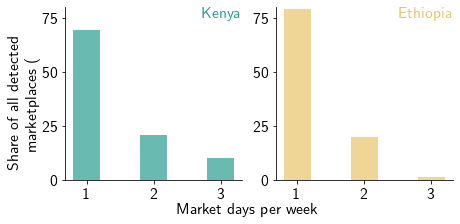

In [29]:
import geopandas as gpd
import matplotlib.pyplot as plt

empty_matrix = np.empty((2, 3))
# Iterate over each country
cc=-1
for country in ['KEN', 'ETH']:
    cc=cc+1
    # Read the GeoDataFrame
    gdf = gpd.read_file(f'shp_{country}_20240627.shp')
    
    # Get value counts of 'mktid'
    mktid_counts = gdf['mktid'].value_counts()
    count_1_rows = len(mktid_counts[mktid_counts == 1].index.tolist())
    count_2_rows = len(mktid_counts[mktid_counts == 2].index.tolist())
    count_3_rows = len(mktid_counts[mktid_counts == 3].index.tolist())
    #counts[1,:] =[count_1_rows,count_2_rows,count_3_rows]
    empty_matrix[cc,0] = count_1_rows
    empty_matrix[cc,1] = count_2_rows
    empty_matrix[cc,2] = count_3_rows
print(empty_matrix)

row_sums= empty_matrix.sum(axis=1, keepdims=True)

# Divide each element by its row sum
normalized_matrix = 100*empty_matrix / row_sums

# Plotting
maincolors = ['#2A9D8F','#E9C46A','#E76F51']
fontsize=16
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 3))
# Plotting bar chart for KEN
ax1.bar([1,2,3], normalized_matrix[0,:], width=0.4, label='KEN', align='center', alpha=0.7, color=maincolors[0])

# Plotting bar chart for ETH
ax2.bar([1,2,3],normalized_matrix[1,:],  width=0.4, label='ETH', align='center', alpha=0.7, color=maincolors[1])
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
    ax2.spines[spine].set_visible(False)

# Setting labels and title
ax1.annotate("Kenya", xy=(1, 1), xycoords='axes fraction',
                             xytext=(1, 1), va='top', ha='right', fontsize=fontsize,  color=maincolors[0])
ax2.annotate("Ethiopia", xy=(1, 1), xycoords='axes fraction',
                             xytext=(1, 1), va='top', ha='right', fontsize=fontsize,  color=maincolors[1])
ax1.set_xticks([1,2,3], labels=[1,2,3], fontsize=fontsize)
ax2.set_xticks([1,2,3], labels=[1,2,3], fontsize=fontsize)
ax1.set_yticks([0,25,50,75], labels=[0,25,50,75], fontsize=fontsize)
ax2.set_yticks([0,25,50,75], labels=[0,25,50,75], fontsize=fontsize)
ax1.set_ylim(0, 80)  # Set x-axis limits from 1 to 4
ax2.set_ylim(0, 80)  # Set x-axis limits from 1 to 4

#ax.set_xticklabels(market_ids)
ax.legend()
fig.text(0.5, 0.01, 'Market days per week', ha='center', va='center', fontsize=fontsize)
fig.text(0.0, 0.5, 'Share of all detected\nmarketplaces (%)\n', ha='center', va='center',  fontsize=fontsize, rotation=90)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig(f"forFigures/FigureS2.png", transparent=True, bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()

plt.close(fig)
fig.clf()


# Figure S3

In [ ]:
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
# Display some example shapes - two in Kenya, two in Malawi, two in Mozambique, two in Ethiopia
# Two around larger market structures, some in towns, some at crossroads
maincolors = ['#2A9D8F','#e76f51']

gdf = pd.concat([gpd.read_file(f'shp_ETH_20240702.shp'),
                 gpd.read_file(f'shp_KEN_20240702.shp'),
                 gpd.read_file(f'shp_MWI_20240628.shp'),
                 gpd.read_file(f'shp_MOZ_20240628.shp')], ignore_index=True)

locs = ['lon39_04lat14_3454','lon38_4377lat11_6017','lon0_2307lat34_5242','lon-1_6228lat37_5616','lon35_0148lat-16_2','lon34_7589lat-15_018','lon40_313lat-15_0527','lon40_0718lat-13_9583']
zooms =[150,150, 150, 150, 150, 150, 205, 205]
titles = ['A','B','C','D','E','F','G','H']

fig = plt.figure(figsize=(8.5, 11))  # Convert from cm to inches

# Define grid specification with adjusted height ratios
gs = GridSpec(4, 2)  # 2 rows, 4 columns, with the bottom row being twice as high

# Add subplots in the upper half of the figure
#fig, axes = plt.subplots(4, 2, figsize=(21,29.7))

for idx, (loc, title, zoom) in enumerate(zip(locs, titles,zooms)):
    ax = fig.add_subplot(gs[idx])  # 1st subplot

    filtered_gdf = gdf[gdf['mktid'] == loc]
    filtered_gdf = filtered_gdf.to_crs(epsg=3857)
    weekday_values = filtered_gdf['weekdayShp'].unique().tolist()
    print(weekday_values)
    for d, day in enumerate(weekday_values):
        todayShp = filtered_gdf[filtered_gdf['weekdayShp']==day]
        todayShp.plot(ax=ax, alpha=0.5, edgecolor='k', color=maincolors[d])
    minx, miny, maxx, maxy = filtered_gdf.total_bounds
    centroid = filtered_gdf[filtered_gdf['weekdayShp']==day].centroid
    minx, miny, maxx, maxy=centroid.buffer(zoom).total_bounds
    minx=minx-zoom*0.5
    maxx=maxx+zoom*0.5
    # Set the new bounds with the buffer
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    #x.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree(), alpha=.3)

    # Add basemap (high-resolution satellite imagery)
    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, attribution=False)
    # Set plot title and axis
    ax.annotate(title, ha='right', va='top', fontsize=14, xy=(-0.01, 1), xycoords='axes fraction')
    scalebar = ScaleBar(1,'m', box_alpha=0.5) 
    ax.add_artist(scalebar)
    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.savefig(f"forFigures/FigureS3.png", bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()


# Figure S4

In [ ]:
def get_coords(loc): 
    #cnx = mysql.connector.connect(user='root',password='XXX',host='XXX',database='mai-database')
    cursor = cnx.cursor()
    query = (f"SELECT lon, lat FROM `mai-database`.location_file WHERE Location = '{loc}'")
    cursor.execute(query)
    response = cursor.fetchall()
    cursor.close()
    cnx.close()
    
    lon, lat = [row for row in response][0]
    lon = float(lon)
    lat = float(lat)
    return lon, lat

def add_coords(df):
    for index, row in df.iterrows():
        lon, lat = get_coords(row["loc"])
        df.loc[index,'lon'] = lon
        df.loc[index,'lat'] = lat
        
# Load the datasets
kenya_df = pd.read_csv('./validation_results/kenya_valid_detections_50p_max_pMax.csv')
mozambique_df = pd.read_csv('./validation_results/moz_valid_detections_50p_max_pMax.csv')
malawi_df = pd.read_csv('./validation_results/malawi_valid_detections_50p_max_pMax.csv')
siaya = pd.read_csv('forFigures/siaya_market_coordinates.csv')

add_coords(kenya_df)
add_coords(mozambique_df)
add_coords(malawi_df)


def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, unit="km"):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    bar_xs = [sbx, sbx + 2*length * 500]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth)
    #Plot the scalebar label
    ax.text(sbx+ length * 500, sby, str(length) + f' {unit}', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom', fontsize=20)

PIL.Image.MAX_IMAGE_PIXELS = None
def plot_map(ax, df, country, color):
    """Generate a map with specified coordinates on the given axes."""
    clon = list(df['lon'])
    clat = list(df['lat'])
    minlon = min(clon)
    maxlon = max(clon)
    minlat = min(clat)
    maxlat = max(clat)
    central_lon = np.mean([minlon, maxlon])
    central_lat = np.mean([minlat, maxlat])
    
    # Main map
    extent_values = [maxlon - minlon, maxlat - minlat]
    larger_extent = max(extent_values)
    larger_extent_index = np.argmax(extent_values)
    add = extent_values[larger_extent_index]/20
    ext_lon = ((central_lon  -add- larger_extent/2), (central_lon  +add+ larger_extent/2))
    ext_lat = ((central_lat  -add- larger_extent/2), (central_lat  +add+ larger_extent/2))
    print('pre',ext_lon,add)
    #ext_lon = ((central_lon  - larger_extent/2)*0.995, (central_lon  + larger_extent/2)*1.005)
    #print('post',ext_lon)
    if country=="Malawi":
        ax.set_extent([ext_lon[0]-.5, ext_lon[1]-.5, ext_lat[0], ext_lat[1]], crs=ccrs.PlateCarree())
    else:
        ax.set_extent([ext_lon[0], ext_lon[1], ext_lat[0], ext_lat[1]], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    img = PIL.Image.open('forFigures/eo_base_2020_clean_geo.tif')
    img_extent = (-180, 180, -90, 90)
    ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree(), alpha=.3)
    if country=="Kenya":
        scale_bar(ax, 50,(0.05,0.05))
    elif country=="Mozambique":
        scale_bar(ax, 200,(0.05,0.05))
    elif country=="Malawi":
        scale_bar(ax, 100,(0.05,0.05))
        
    ax.set_title(country, y=1.0, pad=5, fontsize = 24)
    
    # Plotting points
    if country=="Kenya":
        gdf = gpd.read_file('forFigures/siaya_villages_bounding.shp')
        gdf.plot(ax=ax, color= maincolors[2], edgecolor='none', alpha=0.3)
        ax.scatter(siaya['mkt_lon'], siaya['mkt_lat'], color = 'gray', label='Points', transform=ccrs.PlateCarree(), marker='s', s=100)
    ax.scatter(df['lon'], df['lat'], color = color, label='Points', transform=ccrs.PlateCarree())
    # Inset map
    
    ax_inset = ax.inset_axes([0, 0.6, 0.4, 0.4], 
                             projection=ccrs.Orthographic(central_longitude=central_lon, 
                                                          central_latitude=central_lat))
    ax_inset.set_extent([central_lon - 15, central_lon + 15, central_lat - 15, central_lat + 15], crs=ccrs.PlateCarree())
    ax_inset.add_feature(cfeature.OCEAN)
    ax_inset.add_feature(cfeature.LAND, facecolor='white')
    ax_inset.add_feature(cfeature.COASTLINE)
    ax_inset.add_feature(cfeature.BORDERS, linestyle='-')
    rectangle = Rectangle((ext_lon[0], ext_lat[0]), ext_lon[1] - ext_lon[0], ext_lat[1] - ext_lat[0], 
                          linewidth=1, edgecolor=color, facecolor=color, alpha=0.8,
                          transform=ccrs.PlateCarree())
    ax_inset.add_patch(rectangle)

dfs = [kenya_df, malawi_df, mozambique_df]
maincolors = ['#2A9D8F','#E9C46A','#E76F51']
country_names = ['Kenya', 'Malawi', 'Mozambique']
fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'wspace': 0.05, 'hspace': 0.05})

for ax,df, country, color in zip(axes, dfs, country_names, maincolors):
    plot_map(ax, df, country, color)

plt.savefig(f"forFigures/FigureS4.png", bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()
plt.close()    
    

# Figure S5

,loc,size,bucket
23,lon0_4413lat34_7168,0.036518,mai2023-401817
148,lon40_5858lat-13_9452,0.036518,p170mozambique0
51,lon0_9405lat34_8114,0.055738,kenya3
109,lon37_2879lat-17_4399,0.056699,p170mozambique2
94,lon35_3223lat-15_6801,0.088412,p152malawi1
75,lon34_8899lat-15_2243,0.097061,p152malawi1
145,lon40_4542lat-14_067,0.113398,p170mozambique0
37,lon0_6068lat34_8465,0.159526,kenya3
135,lon40_2967lat-15_2539,0.160487,p170mozambique2
0,lon-0_0984lat34_5969,0.184512,mai2023-401817


96
[  11.67767364  132.95825637  225.06388776  556.06851292 1305.31853063
 1876.33211612 2092.4195576  2565.83045435 3371.57274107 5484.48346077
 6000.        ]
positions [ 0  1  2  3  4  5  6  7  8  9 10]
length 74
[3 4 5 3 4 4 1 4 4 5] 10 [0.08108108108108109, 0.10810810810810811, 0.13513513513513514, 0.08108108108108109, 0.10810810810810811, 0.10810810810810811, 0.02702702702702703, 0.10810810810810811, 0.10810810810810811, 0.13513513513513514]
deciles [0.036518  0.1598143 0.2331386 0.3567232 0.4620488 0.6626095 0.8989194
 1.1034202 1.2840882 1.9444874 2.619686 ]
[ 0  1  2  3  4  5  6  7  8  9 10] [0.18451200000000004, 2.5437670000000003, 1.4270850000000002, 0.34980400000000006, 0.23544500000000002, 1.8489640000000003, 2.423642, 0.18931700000000004, 1.206055, 0.36037500000000006, 1.7470980000000003, 0.5333550000000001, 0.03651800000000001, 2.291024, 0.571795, 1.515497, 0.238328, 1.9854260000000001, 0.29791000000000006, 0.15952600000000003, 0.8668220000000001, 1.1599270000000002, 0.2

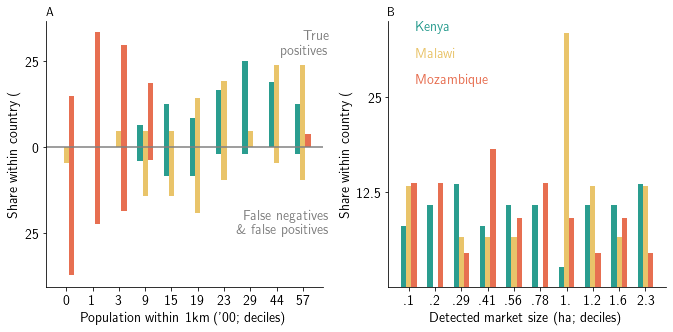

In [31]:
def check_file_exists(bucket, file_path):
    """Check if a file exists in a Google Cloud Storage bucket."""
    blob = bucket.blob(file_path)
    return blob.exists()
import io

#cnx = mysql.connector.connect(user='root',password='XXX',host='XXX',database='mai-database')

query = '''
SELECT l.Location
FROM `mai-database`.`location_file` l
WHERE Validation=1
'''
cursor = cnx.cursor()
cursor.execute(query)
response = cursor.fetchall()
cursor.close()
cnx.close()

locs = [row[0] for row in response]

target_folder ='activity_cleaned_2024'
df_coll = pd.DataFrame({
    'loc': locs
})
#print(locs, len(locs))
i=0

for loc in locs:
    i=i+1
    if check_file_exists(client.get_bucket('exports-mai2023'), f"{target_folder}/df_{loc}.csv"):
        print(f"The file df_{loc}.csv already exists.")
        
        bucket=client.get_bucket('exports-mai2023')
        blob = bucket.blob(f"{target_folder}/df_{loc}.csv")
        csv_string =blob.download_as_string()

        df = pd.read_csv(io.StringIO(csv_string.decode('utf-8')))
        market_days = df.loc[df['mktDay'] == 1, 'weekday'].unique().tolist()
        size_pre=0
        for mktday in market_days:
            for v in range(1,2):
                bestvar = df[f'maxVar_s_{mktday}_maxpMax_{v}'].unique().tolist()[0]
                output_string = bestvar[:bestvar.rfind('_') + 1] + '100'
                output_string = output_string.replace("sumsum", "ccount").replace("maxpmax", "maxpMax")+'_max_count'
                print(output_string)

                size = df[output_string].unique().tolist()
                size = [x for x in size if not pd.isna(x)][0] * (3.1 **2)/10000
                df_coll.loc[df_coll['loc'] == loc, f'bestvar{mktday}_{v}'] = bestvar
                df_coll.loc[df_coll['loc'] == loc, f'size{mktday}_{v}'] = size
                print(size)

        df_coll.loc[df_coll['loc'] == loc, 'size'] =  df_coll.loc[df_coll['loc'] == loc, df_coll.columns.str.startswith('size')].max(axis=1)
    df_coll.loc[df_coll['loc'] == loc, 'country'] = checkLocationFileStatus(loc, 'country')
    df_coll.loc[df_coll['loc'] == loc, 'bucket'] = checkLocationFileStatus(loc, 'bucket')

    display(df_coll.loc[df_coll['loc'] == loc, ])
    
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns', None)
display(df_coll.sort_values(by=['size','bucket'])[['loc', 'size', 'bucket']])
fig = plt.figure(figsize=(24/2.54, 12/2.54))  # Convert from cm to inches
fontsize=14

# Define grid specification with adjusted height ratios
gs = GridSpec(1, 2, width_ratios=[1,1])  # 1 rows, 2 columns
left_ax = fig.add_subplot(gs[0, 0])  # Left portion
right_ax = fig.add_subplot(gs[0, 1])  # Right portion
left_ax.set_title('A', loc='left', fontweight='bold')
right_ax.set_title('B', loc='left', fontweight='bold')
gap =0.05

## SECOND PANEL ##
df_pop = pd.read_csv('forFigures/pop_validation_locs.csv').drop(columns=['.geo','system:index'])

df_strictness= pd.read_csv('forFigures/validation_locs_strictness.csv')
merged_df = pd.merge(df_pop, df_strictness, on='Location', how='inner')
merged_df['valid'] = (merged_df['minStrictnessRank'] < 24).astype(int) # THIS IS ONLY A SHORTCUT FOR NOW; ALSO, THE KENYA DATA INCLUDES THEACTIVITY VALIDATION LOCATIONS
merged_df[['sum']] = merged_df[['sum']].clip(upper=6000)

values_KEN = merged_df.loc[(merged_df['country'] == 'Kenya') & (merged_df['valid']==1), 'sum']
values_KEN_0 = merged_df.loc[(merged_df['country'] == 'Kenya') & (merged_df['valid']==0), 'sum']
values_MOZ = merged_df.loc[(merged_df['country'] == 'Mozambique') & (merged_df['valid']==1), 'sum']
values_MOZ_0 = merged_df.loc[(merged_df['country'] == 'Mozambique') & (merged_df['valid']==0), 'sum']
values_MWI = merged_df.loc[(merged_df['country'] == 'Malawi') & (merged_df['valid']==1), 'sum']
values_MWI_0 = merged_df.loc[(merged_df['country'] == 'Malawi') & (merged_df['valid']==0), 'sum']
print(len(values_KEN)+len(values_MOZ)+len(values_MWI))
# Create histogram with bars separated by color

deciles = np.percentile(values_KEN.tolist()+values_KEN_0.tolist()+values_MWI.tolist()+values_MWI_0.tolist()+values_MOZ.tolist()+values_MOZ_0.tolist()
                        , np.arange(0, 101, 10))

print(deciles)
mid_points = [(deciles[i] + deciles[i+1]) / 2 for i in range(len(deciles) - 1)]
bins = deciles # [1000*x / 2 for x in range(0,14)]   # Example bins, adjust as needed

# Bin the data for both positive and negative classes
positive_counts_KEN, _ = np.histogram(values_KEN, bins=bins)
negative_counts_KEN, _ = np.histogram(values_KEN_0, bins=bins)
positive_counts_MWI, _ = np.histogram(values_MWI, bins=bins)
negative_counts_MWI, _ = np.histogram(values_MWI_0, bins=bins)
positive_counts_MOZ, _ = np.histogram(values_MOZ, bins=bins)
negative_counts_MOZ, _ = np.histogram(values_MOZ_0, bins=bins)

list_pos_KEN = (positive_counts_KEN/len(values_KEN)).tolist()
list_neg_KEN = ((np.array(negative_counts_KEN)*-1)/len(values_KEN)).tolist()
list_pos_MWI = (positive_counts_MWI/len(values_MWI)).tolist()
list_neg_MWI = ((np.array(negative_counts_MWI)*-1)/len(values_MWI)).tolist()
list_pos_MOZ = (positive_counts_MOZ/len(values_MOZ))
list_neg_MOZ = ((np.array(negative_counts_MOZ)*-1)/len(values_MOZ)).tolist()

max_values = max([max(vals) for vals in zip(list_pos_KEN, list_pos_MWI, list_pos_MOZ)])
min_values = min([min(vals) for vals in zip(list_neg_KEN, list_neg_MWI, list_neg_MOZ)])

width=0.2
positions = np.arange(len(bins))
print('positions', positions)
left_ax.bar((positions-width).tolist()[:-1], list_pos_KEN, color=maincolors[0], width=width)
left_ax.bar((positions-width).tolist()[:-1], list_neg_KEN, color=maincolors[0], width=width)
left_ax.bar(positions.tolist()[:-1], list_pos_MWI, color=maincolors[1], width=width)
left_ax.bar(positions.tolist()[:-1], list_neg_MWI, color=maincolors[1], width=width)
left_ax.bar((positions+width).tolist()[:-1], list_pos_MOZ, color=maincolors[2], width=width)
left_ax.bar((positions+width).tolist()[:-1], list_neg_MOZ, color=maincolors[2], width=width)

left_ax.text(10, 0.27, '   True \npositives', fontsize=fontsize, color='gray', ha='right')
left_ax.text(10, -.25, 'False negatives \n \& false positives', fontsize=fontsize, color='gray', ha='right')
# Add labels and legend
left_ax.set_xlabel("Population within 1km ('00; deciles)", fontsize=fontsize)
left_ax.set_ylabel('Share within country (%)', fontsize=fontsize)
custom_ticks = np.array(mid_points)
tick_labels = [f'{int(tick/100)}' for tick in custom_ticks]
left_ax.set_xticks(positions.tolist()[:-1], tick_labels)
custom_ticks = np.array([-.5, -.25, 0, .5, .25])
tick_labels = [ f'{int(abs(tick)*100)}' for tick in custom_ticks]
left_ax.set_yticks(custom_ticks, tick_labels)
left_ax.set_ylim(min_values*1.1, max_values*1.1)  # Set x-axis limits from 1 to 4
for spine in ['top', 'right']:
    left_ax.spines[spine].set_visible(False)
left_ax.axhline(y=0, color='gray', linestyle='-', label='Horizontal Line')
left_ax.tick_params(labelsize=fontsize)

## THIRD PANEL ##

values_KEN = df_coll.loc[df_coll['country'] == 'Kenya', 'size']
values_KEN = [x for x in values_KEN if not pd.isna(x) and x<4]
values_MOZ = df_coll.loc[df_coll['country'] == 'Mozambique', 'size']
values_MOZ = [x for x in values_MOZ if not pd.isna(x) and x<4]
values_MWI = df_coll.loc[df_coll['country'] == 'Malawi', 'size']
values_MWI = [x for x in values_MWI if not pd.isna(x) and x<4]
print('length', len(values_KEN)+len(values_MOZ)+len(values_MWI))

deciles = np.percentile(values_KEN +values_MWI +values_MOZ, np.arange(0, 101, 10))
positions = np.arange(len(bins))
counts_KEN, _ = np.histogram(values_KEN, bins=deciles)
counts_MWI, _ = np.histogram(values_MWI, bins=deciles)
counts_MOZ, _ = np.histogram(values_MOZ, bins=deciles)
list_pos_KEN = (counts_KEN/sum(counts_KEN)).tolist()
list_pos_MWI = (counts_MWI/sum(counts_MWI)).tolist()
list_pos_MOZ = (counts_MOZ/sum(counts_MOZ)).tolist()
print(counts_KEN,len(counts_KEN),list_pos_KEN)

print('deciles', deciles)
mid_points = [(deciles[i] + deciles[i+1]) / 2 for i in range(len(deciles) - 1)]
bins = deciles # [1000*x / 2 for x in range(0,14)]   # Example bins, adjust as needed
custom_ticks = np.array(mid_points)
tick_labels = [f"{tick:.1f}".rstrip("0") if tick > 1 else f"{tick:.2f}".lstrip("0").rstrip("0") for tick in custom_ticks]
right_ax.set_xticks(positions.tolist()[:-1], tick_labels)

# Create histogram with bars separated by color
print(positions, values_KEN +values_MWI +values_MOZ)
right_ax.bar((positions-width).tolist()[:-1], list_pos_KEN, color=maincolors[0], width=width)
right_ax.bar((positions).tolist()[:-1], list_pos_MWI, color=maincolors[1], width=width)
right_ax.bar((positions+width).tolist()[:-1], list_pos_MOZ, color=maincolors[2], width=width)
right_ax.set_xlabel('Detected market size (ha; deciles)', fontsize=fontsize)
right_ax.set_ylabel('Share within country (%)', fontsize=fontsize)
right_ax.set_yticks([.125, .25], [12.5, 25])
right_ax.annotate("Kenya", ha='left', va='top', fontsize=14, xy=(0.1, 1), xycoords='axes fraction',color=maincolors[0])
right_ax.annotate("Malawi", ha='left', va='top', fontsize=14, xy=(0.1, .9), xycoords='axes fraction',color=maincolors[1])
right_ax.annotate("Mozambique", ha='left', va='top', fontsize=14, xy=(0.1, .8), xycoords='axes fraction',color=maincolors[2])

for spine in ['top', 'right']:
    right_ax.spines[spine].set_visible(False)
right_ax.tick_params(labelsize=fontsize)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig(f"forFigures/FigureS5.png", transparent=True, bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()

plt.close(fig)
fig.clf()


# Figure S6

In [5]:
# Fig S4
from matplotlib_scalebar.scalebar import ScaleBar

gdf = pd.concat([gpd.read_file(f'shp_KEN_20240702.shp'),
                 gpd.read_file(f'shp_MWI_20240628.shp'),
                 gpd.read_file(f'shp_MOZ_20240628.shp')], ignore_index=True)

locs = ['lon1_0312lat34_9975','lon0_4892lat34_8373',"lon39_2759lat-15_1246","lon38_0526lat-16_9714","lon35_0148lat-16_2"]
zooms =[210,150, 210, 210, 150]
titles = ['A','B','C','D','E']

fig = plt.figure(figsize=(8.5, 11*3/4))  # Convert from cm to inches

# Define grid specification with adjusted height ratios
gs = GridSpec(4, 2)  # 2 rows, 4 columns, with the bottom row being twice as high

# Add subplots in the upper half of the figure
#fig, axes = plt.subplots(4, 2, figsize=(21,29.7))

for idx, (loc, title, zoom) in enumerate(zip(locs, titles,zooms)):
    ax = fig.add_subplot(gs[idx])  # 1st subplot

    filtered_gdf = gdf[gdf['mktid'] == loc]
    filtered_gdf = filtered_gdf.to_crs(epsg=3857)
    weekday_values = filtered_gdf['weekdayShp'].unique().tolist()
    print(weekday_values)
    for d, day in enumerate(weekday_values):
        todayShp =  filtered_gdf[filtered_gdf['weekdayShp']==day]
        todayShp.plot(ax=ax, alpha=0.5, edgecolor='k', color=maincolors[d])
    minx, miny, maxx, maxy = filtered_gdf.total_bounds
    centroid = filtered_gdf[filtered_gdf['weekdayShp']==day].centroid
    minx, miny, maxx, maxy=centroid.buffer(zoom).total_bounds
    minx=minx-zoom*1.05
    maxx=maxx+zoom*1.05
    # Set the new bounds with the buffer
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

    # Add basemap (high-resolution satellite imagery)
    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, attribution=False)
    # Set plot title and axis
    ax.annotate(title, ha='right', va='top', fontsize=14, xy=(-0.01, 1), xycoords='axes fraction')

    #ax.set_title(title, fontweight='bold', loc='right', y=.96, x=-0.02, fontsize = 16)
    scalebar = ScaleBar(1,'m', box_alpha=0.5) 
    ax.add_artist(scalebar)

    ax.set_axis_off()

# Display the plot
plt.tight_layout()
plt.savefig(f"forFigures/FigureS4.png", bbox_inches='tight', pad_inches=0, dpi=300)    
plt.show()


The file df_lon-0_0984lat34_5969.csv already exists.
ccount_maxpMax_30_100_max_count
0.18451200000000004


,loc,bestvar2_1,size2_1,size,country,bucket
0,lon-0_0984lat34_5969,sumsum_maxpMax_30_29,0.184512,0.184512,Kenya,mai2023-401817


,loc,bestvar2_1,size2_1,size,country,bucket
1,lon-0_1611lat35_0727,nan,NaN,NaN,Kenya,kenya3


,loc,bestvar2_1,size2_1,size,country,bucket
2,lon-0_2705lat34_9714,nan,NaN,NaN,Kenya,kenya3


,loc,bestvar2_1,size2_1,size,country,bucket
3,lon-0_3438lat34_8801,nan,NaN,NaN,Kenya,kenya3


,loc,bestvar2_1,size2_1,size,country,bucket
4,lon0_0828lat34_0457,nan,NaN,NaN,Kenya,kenya3


,loc,bestvar2_1,size2_1,size,country,bucket
5,lon0_128lat34_8609,nan,NaN,NaN,Kenya,planetupload


,loc,bestvar2_1,size2_1,size,country,bucket
6,lon0_1971lat34_6969,nan,NaN,NaN,Kenya,kenya3


The file df_lon0_2034lat34_6665.csv already exists.
ccount_maxpMax_30_100_max_count
2.5437670000000003


,loc,bestvar2_1,size2_1,size,country,bucket
7,lon0_2034lat34_6665,sumsum_maxpMax_30_28,2.543767,2.543767,Kenya,planetupload


The file df_lon0_2067lat34_4904.csv already exists.
ccount_maxpMax_29_100_max_count
1.4270850000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1
8,lon0_2067lat34_4904,nan,NaN,1.427085,Kenya,mai2023-401817,sumsum_maxpMax_29_27,1.427085


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1
9,lon0_2233lat34_0217,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN


The file df_lon0_2307lat34_5242.csv already exists.
ccount_maxpMax_29_100_max_count
0.34980400000000006
ccount_maxpMax_28_100_max_count
0.20565400000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1
10,lon0_2307lat34_5242,nan,NaN,0.349804,Kenya,mai2023-401817,nan,NaN,sumsum_maxpMax_29_28,0.349804,sumsum_maxpMax_28_26,0.205654


The file df_lon0_2793lat34_1182.csv already exists.
ccount_maxpMax_30_100_max_count
0.23544500000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
11,lon0_2793lat34_1182,nan,NaN,0.235445,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,0.235445


The file df_lon0_2799lat34_1194.csv already exists.
ccount_maxpMax_30_100_max_count
1.8489640000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
12,lon0_2799lat34_1194,nan,NaN,1.848964,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,1.848964


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
13,lon0_2912lat34_6978,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
14,lon0_3015lat34_6234,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
15,lon0_3355lat34_6492,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_335lat34_8133.csv already exists.
ccount_maxpMax_30_100_max_count
2.423642


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
16,lon0_335lat34_8133,nan,NaN,2.423642,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,2.423642


The file df_lon0_3606lat34_4016.csv already exists.
ccount_maxpMax_28_100_max_count
0.18931700000000004
ccount_maxpMax_28_100_max_count
0.18931700000000004


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
17,lon0_3606lat34_4016,nan,NaN,0.189317,Kenya,kenya3,sumsum_maxpMax_28_26,0.189317,nan,NaN,nan,NaN,sumsum_maxpMax_28_26,0.189317


The file df_lon0_3615lat34_6235.csv already exists.
ccount_maxpMax_29_100_max_count
1.206055


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
18,lon0_3615lat34_6235,nan,NaN,1.206055,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_29_27,1.206055


The file df_lon0_3757lat34_8538.csv already exists.
ccount_maxpMax_29_100_max_count
0.36037500000000006


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
19,lon0_3757lat34_8538,sumsum_maxpMax_29_27,0.360375,0.360375,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
20,lon0_3816lat34_5842,nan,NaN,NaN,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_3943lat34_6674.csv already exists.
ccount_maxpMax_29_100_max_count
1.7470980000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
21,lon0_3943lat34_6674,nan,NaN,1.747098,Kenya,kenya3,sumsum_maxpMax_29_26,1.747098,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_4218lat34_4254.csv already exists.
ccount_maxpMax_25_100_max_count
0.5333550000000001
ccount_maxpMax_26_100_max_count
0.103788


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1
22,lon0_4218lat34_4254,nan,NaN,0.533355,Kenya,mai2023-401817,sumsum_maxpMax_25_23,0.533355,nan,NaN,nan,NaN,sumsum_maxpMax_26_24,0.103788


The file df_lon0_4413lat34_7168.csv already exists.
ccount_maxpMax_27_100_max_count
0.03651800000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
23,lon0_4413lat34_7168,nan,NaN,0.036518,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_27_25,0.036518


The file df_lon0_4471lat34_8539.csv already exists.
ccount_maxpMax_30_100_max_count
2.291024


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
24,lon0_4471lat34_8539,nan,NaN,2.291024,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,2.291024


The file df_lon0_453lat34_6138.csv already exists.
ccount_maxpMax_21_100_max_count
0.571795


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
25,lon0_453lat34_6138,nan,NaN,0.571795,Kenya,planetupload,nan,NaN,sumsum_maxpMax_21_20,0.571795,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
26,lon0_471lat34_315,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
27,lon0_4736lat34_7019,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
28,lon0_4818lat34_3863,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
29,lon0_4845lat34_7496,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
30,lon0_4886lat34_7036,nan,NaN,NaN,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_4892lat34_8373.csv already exists.
ccount_maxpMax_28_100_max_count
1.515497


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
31,lon0_4892lat34_8373,nan,NaN,1.515497,Kenya,kenya3,sumsum_maxpMax_28_26,1.515497,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
32,lon0_5214lat34_7107,nan,NaN,NaN,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_5364lat34_4999.csv already exists.
ccount_maxpMax_29_100_max_count
0.238328


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
33,lon0_5364lat34_4999,nan,NaN,0.238328,Kenya,kenya3,sumsum_maxpMax_29_28,0.238328,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_5649lat34_3898.csv already exists.
ccount_maxpMax_30_100_max_count
1.9854260000000001
ccount_maxpMax_27_100_max_count
1.1262920000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1
34,lon0_5649lat34_3898,nan,NaN,1.985426,Kenya,mai2023-401817,nan,NaN,sumsum_maxpMax_27_25,1.126292,sumsum_maxpMax_30_29,1.985426,nan,NaN,nan,NaN


The file df_lon0_5924lat34_4901.csv already exists.
ccount_maxpMax_27_100_max_count
0.20277100000000003
ccount_maxpMax_29_100_max_count
0.29791000000000006


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
35,lon0_5924lat34_4901,nan,NaN,0.29791,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_27_26,0.202771,nan,NaN,sumsum_maxpMax_29_27,0.29791


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
36,lon0_604lat34_8756,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_6068lat34_8465.csv already exists.
ccount_maxpMax_30_100_max_count
0.15952600000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
37,lon0_6068lat34_8465,nan,NaN,0.159526,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,0.159526,nan,NaN


The file df_lon0_6072lat34_9631.csv already exists.
ccount_maxpMax_26_100_max_count
0.8668220000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
38,lon0_6072lat34_9631,nan,NaN,0.866822,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_26_25,0.866822,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
39,lon0_609lat34_7597,nan,NaN,NaN,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_6484lat34_5171.csv already exists.
ccount_maxpMax_30_100_max_count
1.1599270000000002
ccount_maxpMax_30_100_max_count
1.1599270000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
40,lon0_6484lat34_5171,sumsum_maxpMax_30_28,1.159927,1.159927,Kenya,mai2023-401817,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,1.159927,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_6511lat34_8766.csv already exists.
ccount_maxpMax_30_100_max_count
0.27484600000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
41,lon0_6511lat34_8766,nan,NaN,0.274846,Kenya,kenya3,nan,NaN,sumsum_maxpMax_30_28,0.274846,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_6563lat34_5907.csv already exists.
ccount_maxpMax_30_100_max_count
0.8735490000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
42,lon0_6563lat34_5907,nan,NaN,0.873549,Kenya,kenya3,nan,NaN,sumsum_maxpMax_30_28,0.873549,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_6721lat35_1566.csv already exists.
ccount_maxpMax_28_100_max_count
0.21910800000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
43,lon0_6721lat35_1566,nan,NaN,0.219108,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_28_26,0.219108,nan,NaN


The file df_lon0_7134lat35_1064.csv already exists.
ccount_maxpMax_29_100_max_count
0.36421900000000007


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
44,lon0_7134lat35_1064,nan,NaN,0.364219,Kenya,planetupload,sumsum_maxpMax_29_26,0.364219,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_7281lat34_8767.csv already exists.
ccount_maxpMax_29_100_max_count
1.2560270000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
45,lon0_7281lat34_8767,nan,NaN,1.256027,Kenya,planetupload,sumsum_maxpMax_29_26,1.256027,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_7748lat34_7176.csv already exists.
ccount_maxpMax_30_100_max_count
6.021626000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
46,lon0_7748lat34_7176,nan,NaN,6.021626,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_26,6.021626,nan,NaN,nan,NaN


The file df_lon0_7783lat34_79.csv already exists.
ccount_maxpMax_27_100_max_count
0.35749200000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
47,lon0_7783lat34_79,sumsum_maxpMax_27_24,0.357492,0.357492,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_8305lat35_0898.csv already exists.
ccount_maxpMax_30_100_max_count
0.700569


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
48,lon0_8305lat35_0898,nan,NaN,0.700569,Kenya,kenya3,nan,NaN,sumsum_maxpMax_30_28,0.700569,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_8342lat34_8647.csv already exists.
ccount_maxpMax_30_100_max_count
0.6381040000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
49,lon0_8342lat34_8647,nan,NaN,0.638104,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_29,0.638104,nan,NaN


The file df_lon0_8417lat34_9931.csv already exists.
ccount_maxpMax_30_100_max_count
1.102267


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
50,lon0_8417lat34_9931,nan,NaN,1.102267,Kenya,planetupload,nan,NaN,sumsum_maxpMax_30_29,1.102267,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon0_9405lat34_8114.csv already exists.
ccount_maxpMax_28_100_max_count
0.05573800000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
51,lon0_9405lat34_8114,nan,NaN,0.055738,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_28_25,0.055738,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
52,lon0_9824lat35_2213,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
53,lon1_004lat34_9175,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon1_0179lat35_0027.csv already exists.
ccount_maxpMax_22_100_max_count
0.22679600000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
54,lon1_0179lat35_0027,nan,NaN,0.226796,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_22_21,0.226796


The file df_lon1_0312lat34_9975.csv already exists.
ccount_maxpMax_30_100_max_count
2.6196860000000006


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
55,lon1_0312lat34_9975,sumsum_maxpMax_30_29,2.619686,2.619686,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
56,lon1_0496lat35_2235,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
57,lon1_0954lat34_7714,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon1_1335lat34_8349.csv already exists.
ccount_maxpMax_29_100_max_count
0.7572680000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
58,lon1_1335lat34_8349,nan,NaN,0.757268,Kenya,planetupload,nan,NaN,sumsum_maxpMax_29_27,0.757268,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
59,lon1_1357lat35_0567,nan,NaN,NaN,Kenya,kenya3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon1_1641lat35_1124.csv already exists.
ccount_maxpMax_27_100_max_count
1.1628100000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
60,lon1_1641lat35_1124,nan,NaN,1.16281,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_27_25,1.16281,nan,NaN,nan,NaN


The file df_lon1_2148lat34_9039.csv already exists.
ccount_maxpMax_29_100_max_count
0.5227840000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
61,lon1_2148lat34_9039,nan,NaN,0.522784,Kenya,mai2023-401817,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_29_27,0.522784,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
62,lon34_463lat-15_9746,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
63,lon34_6145lat-16_0933,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
64,lon34_6505lat-15_4722,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
65,lon34_6563lat-15_3998,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
66,lon34_6797lat-15_3004,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
67,lon34_698lat-15_5932,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
68,lon34_7053lat0_4905,nan,NaN,NaN,Kenya,planetupload,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon34_7697lat0_6017.csv already exists.
ccount_maxpMax_30_100_max_count
5.245138000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
69,lon34_7697lat0_6017,nan,NaN,5.245138,Kenya,mai2023-401817,nan,NaN,sumsum_maxpMax_30_26,5.245138,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
70,lon34_7787lat-15_446,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
71,lon34_8035lat-16_0444,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
72,lon34_8547lat-15_4476,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon34_8708lat-16_2744.csv already exists.
ccount_maxpMax_30_100_max_count
0.373829


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
73,lon34_8708lat-16_2744,nan,NaN,0.373829,Malawi,p152malawi0,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,0.373829,nan,NaN,nan,NaN,nan,NaN


The file df_lon34_8824lat-16_46.csv already exists.
ccount_maxpMax_27_100_max_count
2.1555230000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
74,lon34_8824lat-16_46,nan,NaN,2.155523,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_27_25,2.155523,nan,NaN,nan,NaN


The file df_lon34_8899lat-15_2243.csv already exists.
ccount_maxpMax_29_100_max_count
0.09706100000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
75,lon34_8899lat-15_2243,nan,NaN,0.097061,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_29_27,0.097061,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
76,lon34_8937lat-16_4883,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
77,lon34_943lat-15_4636,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon34_9538lat-15_9094.csv already exists.
ccount_maxpMax_29_100_max_count
0.9831030000000001
ccount_maxpMax_27_100_max_count
0.6669340000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
78,lon34_9538lat-15_9094,nan,NaN,0.983103,Malawi,p152malawi0,nan,NaN,sumsum_maxpMax_29_27,0.983103,sumsum_maxpMax_27_26,0.666934,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
79,lon34_9568lat-14_9884,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_0148lat-16_2.csv already exists.
ccount_maxpMax_25_100_max_count
0.19123900000000002
ccount_maxpMax_29_100_max_count
1.073437


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
80,lon35_0148lat-16_2,sumsum_maxpMax_25_23,0.191239,1.073437,Malawi,p152malawi1,nan,NaN,nan,NaN,sumsum_maxpMax_29_28,1.073437,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
81,lon35_0552lat-14_9108,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_1064lat-16_5778.csv already exists.
ccount_maxpMax_29_100_max_count
1.232963


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
82,lon35_1064lat-16_5778,nan,NaN,1.232963,Malawi,p152malawi0,nan,NaN,sumsum_maxpMax_29_27,1.232963,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
83,lon35_1615lat-16_409,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_1714lat-14_8419.csv already exists.
ccount_maxpMax_30_100_max_count
0.9052620000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
84,lon35_1714lat-14_8419,nan,NaN,0.905262,Malawi,p152malawi0,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,0.905262,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
85,lon35_1809lat-14_6383,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_2169lat-16_9801.csv already exists.
ccount_maxpMax_29_100_max_count
1.167615


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
86,lon35_2169lat-16_9801,sumsum_maxpMax_29_27,1.167615,1.167615,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_2186lat-15_0625.csv already exists.
ccount_maxpMax_30_100_max_count
0.46031900000000003
ccount_maxpMax_29_100_max_count
0.513174
ccount_maxpMax_29_100_max_count
0.513174


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
87,lon35_2186lat-15_0625,sumsum_maxpMax_29_28,0.513174,0.513174,Malawi,p152malawi0,nan,NaN,sumsum_maxpMax_30_29,0.460319,sumsum_maxpMax_29_28,0.513174,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
88,lon35_2544lat-14_4823,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
89,lon35_2551lat-16_9203,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
90,lon35_2792lat-16_781,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
91,lon35_2865lat-14_4675,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
92,lon35_295lat-16_8482,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
93,lon35_3194lat-17_1441,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_3223lat-15_6801.csv already exists.
ccount_maxpMax_26_100_max_count
0.08841200000000002
ccount_maxpMax_26_100_max_count
0.08841200000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
94,lon35_3223lat-15_6801,nan,NaN,0.088412,Malawi,p152malawi1,nan,NaN,sumsum_maxpMax_26_25,0.088412,sumsum_maxpMax_26_25,0.088412,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_4464lat-14_1831.csv already exists.
ccount_maxpMax_30_100_max_count
2.46016


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
95,lon35_4464lat-14_1831,sumsum_maxpMax_30_29,2.46016,2.46016,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
96,lon35_4511lat-14_362,nan,NaN,NaN,Malawi,p152malawi0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_4952lat-14_9975.csv already exists.
ccount_maxpMax_30_100_max_count
1.0782420000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
97,lon35_4952lat-14_9975,nan,NaN,1.078242,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,1.078242


The file df_lon35_5286lat-14_87.csv already exists.
ccount_maxpMax_30_100_max_count
1.073437


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
98,lon35_5286lat-14_87,nan,NaN,1.073437,Malawi,p152malawi0,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,1.073437,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_5524lat-14_7175.csv already exists.
ccount_maxpMax_30_100_max_count
1.6154410000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
99,lon35_5524lat-14_7175,nan,NaN,1.615441,Malawi,p152malawi1,nan,NaN,sumsum_maxpMax_30_28,1.615441,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
100,lon35_6374lat-15_8082,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
101,lon35_6579lat-17_3071,nan,NaN,NaN,Mozambique,p170mozambique5,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
102,lon35_6926lat-15_7171,nan,NaN,NaN,Malawi,p152malawi1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
103,lon35_7558lat-17_2835,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon35_8029lat-14_7099.csv already exists.
ccount_maxpMax_30_100_max_count
0.27869000000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
104,lon35_8029lat-14_7099,nan,NaN,0.27869,Malawi,p152malawi1,sumsum_maxpMax_30_28,0.27869,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
105,lon36_8544lat-16_3513,nan,NaN,NaN,Mozambique,p170mozambique5,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
106,lon36_8544lat-16_3523,nan,NaN,NaN,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon37_2009lat-17_2457.csv already exists.
ccount_maxpMax_30_100_max_count
0.6505970000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
107,lon37_2009lat-17_2457,nan,NaN,0.650597,Mozambique,p170mozambique2,nan,NaN,nan,NaN,sumsum_maxpMax_30_29,0.650597,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
108,lon37_2538lat-17_4181,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon37_2879lat-17_4399.csv already exists.
ccount_maxpMax_22_100_max_count
0.05669900000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
109,lon37_2879lat-17_4399,nan,NaN,0.056699,Mozambique,p170mozambique2,nan,NaN,nan,NaN,sumsum_maxpMax_22_21,0.056699,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
110,lon37_3683lat-17_5623,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
111,lon37_4643lat-17_56,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
112,lon37_4894lat-17_0106,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
113,lon37_5985lat-16_7716,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
114,lon37_6716lat-17_4835,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
115,lon37_769lat-17_1516,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon37_8955lat-17_2575.csv already exists.
ccount_maxpMax_24_100_max_count
0.46896800000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
116,lon37_8955lat-17_2575,nan,NaN,0.468968,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_24_23,0.468968,nan,NaN


The file df_lon37_9798lat-17_1055.csv already exists.
ccount_maxpMax_25_100_max_count
0.4218790000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
117,lon37_9798lat-17_1055,sumsum_maxpMax_25_23,0.421879,0.421879,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon38_0526lat-16_9714.csv already exists.
ccount_maxpMax_30_100_max_count
0.6746220000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
118,lon38_0526lat-16_9714,sumsum_maxpMax_30_29,0.674622,0.674622,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
119,lon38_3048lat-16_8889,nan,NaN,NaN,Mozambique,p170mozambique5,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
120,lon38_4068lat-16_9375,nan,NaN,NaN,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
121,lon38_6128lat-16_8856,nan,NaN,NaN,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
122,lon39_1221lat-15_0092,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon39_2759lat-15_1246.csv already exists.
ccount_maxpMax_30_100_max_count
2.0363590000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
123,lon39_2759lat-15_1246,nan,NaN,2.036359,Mozambique,p170mozambique4,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_30_27,2.036359


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
124,lon39_5196lat-14_0691,nan,NaN,NaN,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon39_691lat-13_8198.csv already exists.
ccount_maxpMax_24_100_max_count
0.7995520000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
125,lon39_691lat-13_8198,nan,NaN,0.799552,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_24_22,0.799552


The file df_lon39_8957lat-14_6214.csv already exists.
ccount_maxpMax_28_100_max_count
0.9831030000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
126,lon39_8957lat-14_6214,nan,NaN,0.983103,Mozambique,p170mozambique1,nan,NaN,nan,NaN,sumsum_maxpMax_28_25,0.983103,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_0718lat-13_9583.csv already exists.
ccount_maxpMax_30_100_max_count
0.9955960000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
127,lon40_0718lat-13_9583,nan,NaN,0.995596,Mozambique,p170mozambique1,nan,NaN,nan,NaN,sumsum_maxpMax_30_28,0.995596,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_1299lat-14_716.csv already exists.
ccount_maxpMax_26_100_max_count
1.3665420000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
128,lon40_1299lat-14_716,nan,NaN,1.366542,Mozambique,p170mozambique1,nan,NaN,nan,NaN,sumsum_maxpMax_26_24,1.366542,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_1338lat-14_9.csv already exists.
ccount_maxpMax_29_100_max_count
0.287339


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
129,lon40_1338lat-14_9,nan,NaN,0.287339,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_29_28,0.287339


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
130,lon40_1529lat-14_9584,nan,NaN,NaN,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
131,lon40_1779lat-15_3413,nan,NaN,NaN,Mozambique,p170mozambique2,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
132,lon40_1822lat-15_1008,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
133,lon40_2405lat-15_1293,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_2439lat-14_7114.csv already exists.
ccount_maxpMax_25_100_max_count
1.3261800000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
134,lon40_2439lat-14_7114,nan,NaN,1.32618,Mozambique,p170mozambique1,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_25_22,1.32618


The file df_lon40_2967lat-15_2539.csv already exists.
ccount_maxpMax_19_100_max_count
0.16048700000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
135,lon40_2967lat-15_2539,nan,NaN,0.160487,Mozambique,p170mozambique2,nan,NaN,sumsum_maxpMax_19_17,0.160487,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_3033lat-13_8105.csv already exists.
ccount_maxpMax_30_100_max_count
0.758229


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
136,lon40_3033lat-13_8105,nan,NaN,0.758229,Mozambique,p170mozambique0,nan,NaN,nan,NaN,sumsum_maxpMax_30_27,0.758229,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_313lat-15_0527.csv already exists.
ccount_maxpMax_26_100_max_count
0.19123900000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
137,lon40_313lat-15_0527,nan,NaN,0.191239,Mozambique,p170mozambique3,nan,NaN,nan,NaN,sumsum_maxpMax_26_24,0.191239,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_3317lat-15_665.csv already exists.
ccount_maxpMax_27_100_max_count
0.4218790000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
138,lon40_3317lat-15_665,nan,NaN,0.421879,Mozambique,p170mozambique3,nan,NaN,nan,NaN,sumsum_maxpMax_27_25,0.421879,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_3553lat-15_1824.csv already exists.
ccount_maxpMax_28_100_max_count
0.36133600000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
139,lon40_3553lat-15_1824,nan,NaN,0.361336,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_28_27,0.361336,nan,NaN,nan,NaN


The file df_lon40_3594lat-14_8009.csv already exists.
ccount_maxpMax_29_100_max_count
0.46031900000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
140,lon40_3594lat-14_8009,nan,NaN,0.460319,Mozambique,p170mozambique1,nan,NaN,nan,NaN,sumsum_maxpMax_29_25,0.460319,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
141,lon40_4133lat-13_6573,nan,NaN,NaN,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
142,lon40_4157lat-14_4235,nan,NaN,NaN,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
143,lon40_4299lat-13_957,nan,NaN,NaN,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_4315lat-14_3459.csv already exists.
ccount_maxpMax_28_100_max_count
1.1137990000000002


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
144,lon40_4315lat-14_3459,nan,NaN,1.113799,Mozambique,p170mozambique0,nan,NaN,nan,NaN,sumsum_maxpMax_28_25,1.113799,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_4542lat-14_067.csv already exists.
ccount_maxpMax_23_100_max_count
0.11339800000000003


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
145,lon40_4542lat-14_067,nan,NaN,0.113398,Mozambique,p170mozambique0,nan,NaN,nan,NaN,sumsum_maxpMax_23_22,0.113398,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
146,lon40_467lat-15_2152,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
147,lon40_5215lat-14_3051,nan,NaN,NaN,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_5858lat-13_9452.csv already exists.
ccount_maxpMax_18_100_max_count
0.03651800000000001


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
148,lon40_5858lat-13_9452,nan,NaN,0.036518,Mozambique,p170mozambique0,nan,NaN,sumsum_maxpMax_18_17,0.036518,nan,NaN,nan,NaN,nan,NaN,nan,NaN


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
149,lon40_6945lat-14_8443,nan,NaN,NaN,Mozambique,p170mozambique3,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN


The file df_lon40_7055lat-14_2118.csv already exists.
ccount_maxpMax_28_100_max_count
0.22967900000000005


,loc,bestvar2_1,size2_1,size,country,bucket,bestvar1_1,size1_1,bestvar3_1,size3_1,bestvar6_1,size6_1,bestvar4_1,size4_1,bestvar5_1,size5_1,bestvar0_1,size0_1
150,lon40_7055lat-14_2118,nan,NaN,0.229679,Mozambique,p170mozambique0,nan,NaN,nan,NaN,nan,NaN,nan,NaN,nan,NaN,sumsum_maxpMax_28_26,0.229679


,loc,size,bucket
23,lon0_4413lat34_7168,0.036518,mai2023-401817
148,lon40_5858lat-13_9452,0.036518,p170mozambique0
51,lon0_9405lat34_8114,0.055738,kenya3
109,lon37_2879lat-17_4399,0.056699,p170mozambique2
94,lon35_3223lat-15_6801,0.088412,p152malawi1
75,lon34_8899lat-15_2243,0.097061,p152malawi1
145,lon40_4542lat-14_067,0.113398,p170mozambique0
37,lon0_6068lat34_8465,0.159526,kenya3
135,lon40_2967lat-15_2539,0.160487,p170mozambique2
0,lon-0_0984lat34_5969,0.184512,mai2023-401817


 # Table S1 (GEE code)

In [ ]:
Map.setOptions('HYBRID')

var religious_points_ETH = eth_points.merge(eth_poly.map(function(p){return p.centroid()}))
                            .distinct('.geo')

var markets = table.merge(table2)
              //.filterBounds(test)

var religious_points = ee.FeatureCollection('projects/planetupload/assets/Religious_Points_Kenya')
  .merge(religious_points_ETH)
                //.filterBounds(test)

print('markets', markets.limit(5000))
print('religious_points', religious_points.limit(5000), religious_points.size())

Map.addLayer(markets, {'color': 'red'}, 'markets')
Map.addLayer(religious_points, {'color': 'blue'}, 'religious_points')

var religious_points_dist = religious_points.distance({searchRadius: 500000, maxError:1})
  .unmask(1e20)
  .select(['distance'],['dist_pofw'])
//var religious_points_dist = ic.filterBounds(test).first().select(['B1'],['dist_pofw'])

print('religious_points_dist', religious_points_dist)
Map.addLayer(religious_points_dist, {max:500, bands:['dist_pofw']}, 'religious_points_dist')
var  markets_post = religious_points_dist.reduceRegions({
  collection: markets,
  reducer: ee.Reducer.min(),
  scale: 1
}).select(['min', 'weekdayShp' ],['dist_pofw','weekdayShp'])

print('markets with distance property', markets_post)
Map.addLayer(markets_post, {'color': 'green'}, 'markets with distance property')



var markets_ETH = markets_post.filterBounds(ethiopia)
var size_ETH = markets_ETH.size()
var markets_KEN = markets_post.filterBounds(kenya)
var size_KEN = markets_KEN.size()
print('markets_ETH',markets_ETH, 'size_ETH', size_ETH,'size_KEN',size_KEN)

print('50m, Kenya:', markets_KEN.filter(ee.Filter.lt('dist_pofw',50)).size(),markets_KEN.filter(ee.Filter.lt('dist_pofw',50)).size().divide(size_KEN))
print('50m , Ethiopia:', markets_ETH.filter(ee.Filter.lt('dist_pofw',50)).size(),markets_ETH.filter(ee.Filter.lt('dist_pofw',50)).size().divide(size_ETH))
print('100m, Kenya:', markets_KEN.filter(ee.Filter.lt('dist_pofw',100)).size(),markets_KEN.filter(ee.Filter.lt('dist_pofw',100)).size().divide(size_KEN))
print('100m, Ethiopia:', markets_ETH.filter(ee.Filter.lt('dist_pofw',100)).size(),markets_ETH.filter(ee.Filter.lt('dist_pofw',100)).size().divide(size_ETH))
print('250m, Kenya:', markets_KEN.filter(ee.Filter.lt('dist_pofw',250)).size(),markets_KEN.filter(ee.Filter.lt('dist_pofw',250)).size().divide(size_KEN))
print('250m, Ethiopia:', markets_ETH.filter(ee.Filter.lt('dist_pofw',250)).size(),markets_ETH.filter(ee.Filter.lt('dist_pofw',250)).size().divide(size_ETH))

var friSunMarkets_ETH = markets_ETH.filter(ee.Filter.inList('weekdayShp',[0,5,6]))
var size_ETH = friSunMarkets_ETH.size()
var friSunMarkets_KEN = markets_KEN.filter(ee.Filter.inList('weekdayShp',[0,5,6]))
var size_KEN = friSunMarkets_KEN.size()
print('Fri/Sun Markets within 50m, Kenya:', friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',50)).size(),friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',50)).size().divide(size_KEN))
print('Fri/Sun Markets within 50m, Ethiopia:', friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',50)).size(),friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',50)).size().divide(size_ETH))
print('Fri/Sun Markets within 100m, Kenya:', friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',100)).size(),friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',100)).size().divide(size_KEN))
print('Fri/Sun Markets within 100m, Ethiopia:', friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',100)).size(),friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',100)).size().divide(size_ETH))
print('Fri/Sun Markets within 250m, Kenya:', friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',250)).size(),friSunMarkets_KEN.filter(ee.Filter.lt('dist_pofw',250)).size().divide(size_KEN))
print('Fri/Sun Markets within 250m, Ethiopia:', friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',250)).size(),friSunMarkets_ETH.filter(ee.Filter.lt('dist_pofw',250)).size().divide(size_ETH))

print('friSunMarkets_ETH',friSunMarkets_ETH, 'size_ETH', size_ETH,'size_KEN',size_KEN)

print('ETH distance to pofw',markets_ETH.aggregate_mean('dist_pofw'),markets_ETH.reduceColumns(ee.Reducer.median(), ['dist_pofw']))
print('KEN distance to pofw',markets_KEN.aggregate_mean('dist_pofw'),markets_KEN.reduceColumns(ee.Reducer.median(), ['dist_pofw']))


# Table S2

133_Kenya_20240315
133_Nyanza_3
79_Ethiopia_20231220
133_Kenya_20231220
79_Oromia_6
79_Amhara_8
79_Tigray_5
79_Oromia_9
74_South_Sudan_20240520
133_Eastern_0
79_Afar_0
170_Mozambique_20240102
79_Amhara_7
133_Central_1
133_RiftValley_6
79_SNNPR_0
79_Oromia_10
133_Central_2
133_Eastern_1
133_RiftValley_4
79_Tigray_4
133_Western_2
152_Malawi_20240216
6_Sudan_20240813
133_RiftValley_3
79_Oromia_1
205_Rwanda_20240530
133_Nyanza_1
79_Amhara_6
133_Nyanza_0
79_Amhara_2
79_Ethiopia_20240524
79_Oromia_7
133_Kenya_20240222
133_Nyanza_4
79_Oromia_0
79_Oromia_8
79_Amhara_5
79_SNNPR_2
133_Western_0
79_Amhara_11
79_Amhara_4
79_Amhara_14
79_Amhara_9
253_Uganda_2
253_Uganda_3
155_Mali_20240520
133_RiftValley_2
79_SNNPR_1
133_RiftValley_5
152_Malawi_20240524
79_Amhara_1
205_Rwanda_20240520
253_Uganda_20240728
133_Central_0
79_Amhara_0
133_Kenya_20240408
79_Tigray_0
79_Amhara_16
133_RiftValley_1
133_RiftValley_0
79_Oromia_2
79_Tigray_1
79_BeneshangulGumu_0
133_Western_1
79_Oromia_4
79_Oromia_5
133_Wester

<ipython-input-14-81479fee1b70>:43: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  filtered_gdf['centroid'] = filtered_gdf.geometry.centroid
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-14-81479fee1b70>:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matpl

COUNTRY KEN
Markets: 122
Mean distance: 246.04 meters
Median distance: 31.63 meters
Mean candidate location area: 2495958.43 square meters
Median candidate location area: 853819.43 square meters
{3: 81, 2: 14, 1: 27}
Total detected markets: 551
mktid_to_keep Index(['lon12_4172lat39_5603', 'lon10_959lat36_5095', 'lon10_3003lat37_4647',
       'lon39_8692lat10_7151', 'lon38_9848lat5_8826', 'lon8_3745lat39_9052', 'lon7_0064lat39_3927',
       'lon6_9781lat39_1809', 'lon6_9558lat38_4789', 'lon34_6012lat8_5737', 'lon38_7134lat7_9271',
       'lon38_5378lat6_556', 'lon6_6891lat38_7183', 'lon13_3578lat39_7556', 'lon6_5912lat38_6004',
       'lon6_5261lat38_83', 'lon5_9848lat36_5777', 'lon38_735lat9_7835', 'lon5_8997lat36_5782',
       'lon5_5526lat39_391', 'lon12_7664lat37_6192', 'lon12_5496lat37_0654', 'lon7_618lat39_4918',
       'lon5_3318lat37_4201', 'lon8_7552lat36_499', 'lon8_8134lat40_5183', 'lon8_8198lat41_5664',
       'lon12_1201lat38_0486', 'lon41_7949lat9_4359', 'lon40_6595lat5_11

<ipython-input-14-81479fee1b70>:43: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  filtered_gdf['centroid'] = filtered_gdf.geometry.centroid
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


COUNTRY ETH
Markets: 87
Mean distance: 149.84 meters
Median distance: 25.83 meters
Mean candidate location area: 2183351.95 square meters
Median candidate location area: 379044.40 square meters
{3: 74, 2: 5, 1: 8}
Mean  distance in both countries: 205.99  meters
Median distance in both countries: 27.82  meters


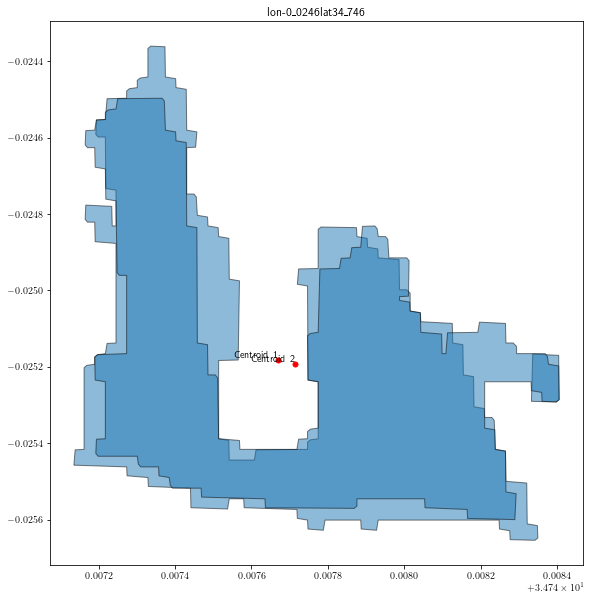

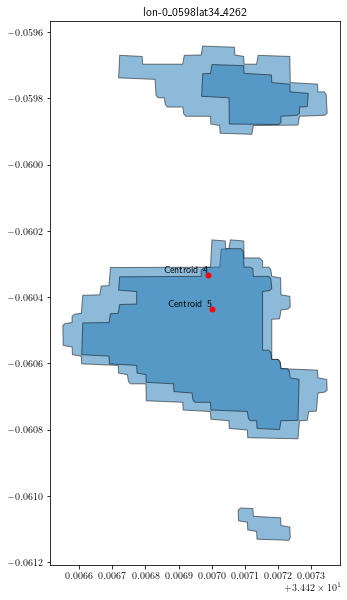

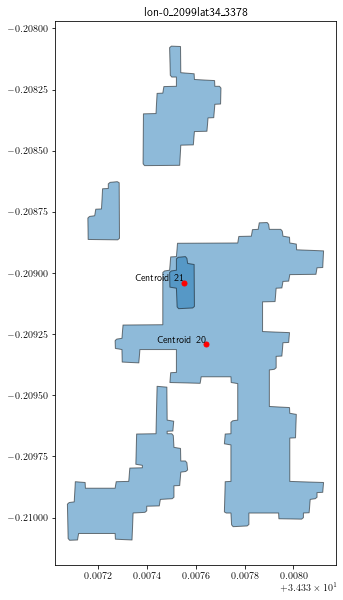

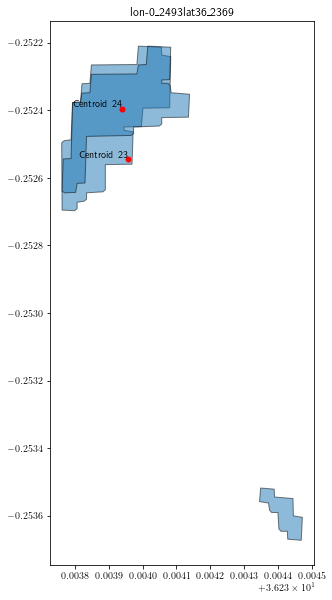

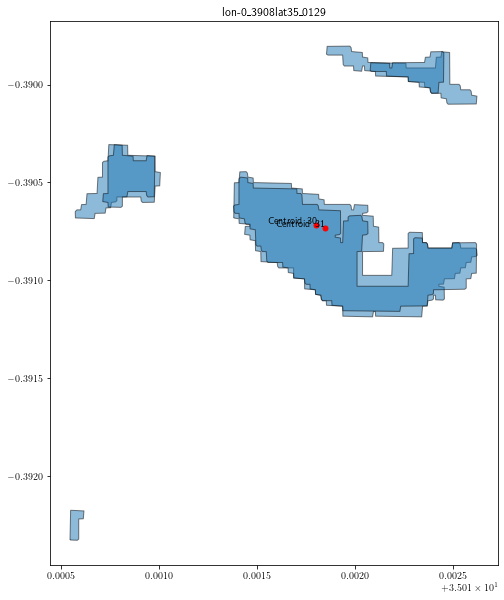

...

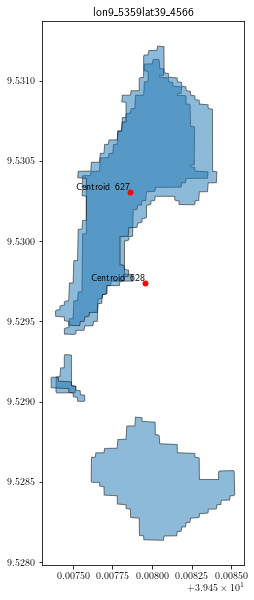

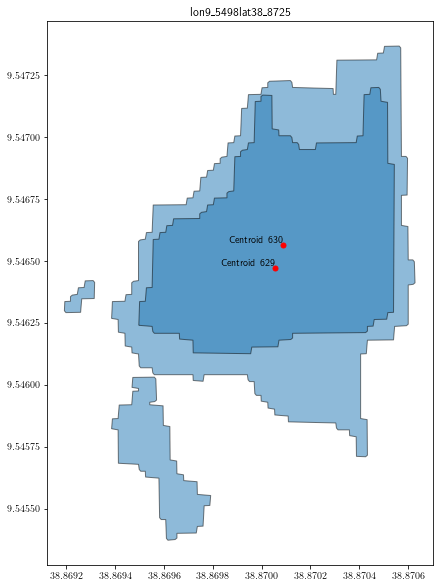

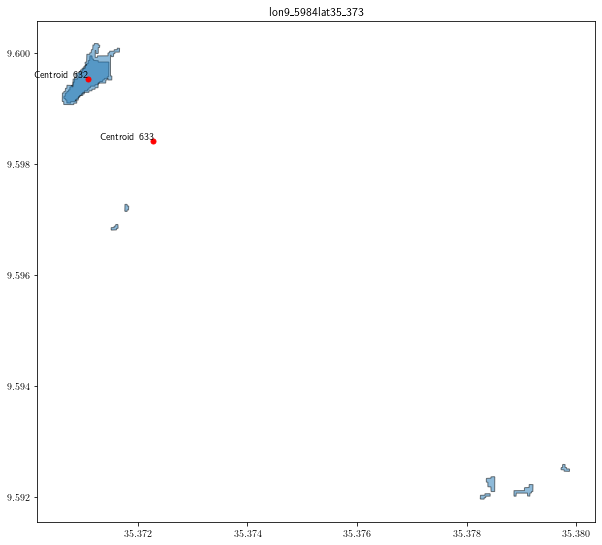

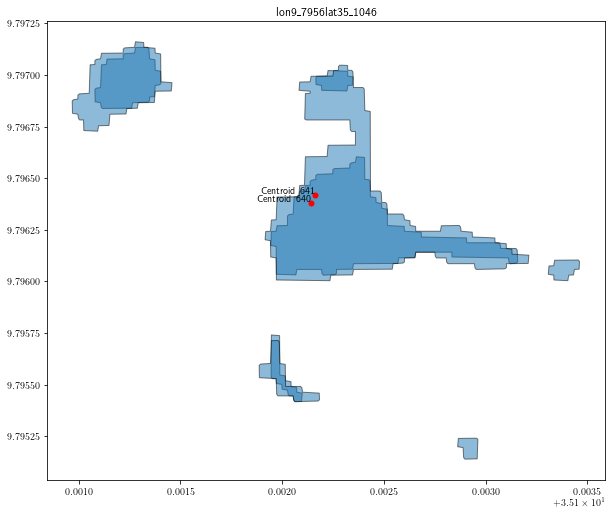

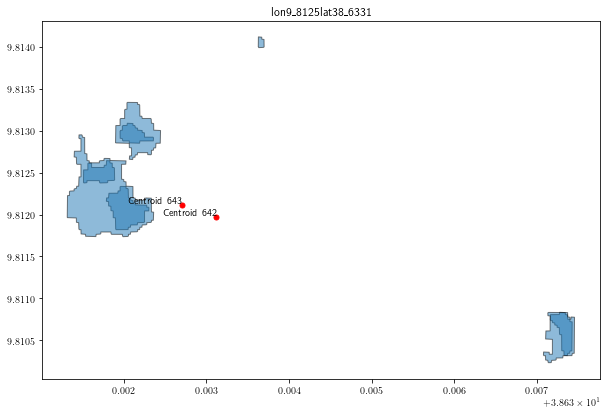

In [14]:
# Distances between centroids of different market days for same locations
import geopandas as gpd
from shapely.geometry import Point
from itertools import combinations
from collections import defaultdict
import geopy.distance
import numpy as np
import itertools
import json
from shapely.geometry import shape
from area import area
bucket=client.get_bucket('mai_2023')

# Load all candidate location geojsons
output = str(subprocess.check_output([f'gcloud storage ls gs://mai_2023/**'], shell=True))
jsonIDs = set(re.findall(fr'gs://mai_2023/(\d+_[A-Z]\w+_\d+)/', output))
candLoc_outlines=[]
for jsonID in jsonIDs:
    print(jsonID)
    data_string = bucket.get_blob(f'{jsonID}/{jsonID}.geojson').download_as_string()
    data = json.loads(data_string)
    for j in data['features']:
        j['properties']['mktID'] = j['properties']['mktID'].replace(".", "_", 2) #fix name format of mktID
        candLoc_outlines.append(j)
print(candLoc_outlines[0:2])
# Combine all features into a single GeoJSON structure
merged_dict = {}
for feature in candLoc_outlines:
    mktid = feature['properties']['mktID']
    merged_dict[mktid] = feature
areas_both=[]
# Load all detected market shapes
for country in ['KEN', 'ETH']:
    gdf = gpd.read_file(f'shp_{country}_20240702.shp')
    mktid_counts = gdf['mktid'].value_counts()

    print(f"Total detected markets: {len(gdf['mktid'].unique())}")
    # keep only markets with more than one detected market day
    mktid_to_keep = mktid_counts.index[mktid_counts > 1]
    print('mktid_to_keep',mktid_to_keep)

    filtered_gdf = gdf[gdf['mktid'].isin(mktid_to_keep)]
    filtered_gdf['centroid'] = filtered_gdf.geometry.centroid

    mktid_distances = defaultdict(list)
    areas = []
    all_differences = []

    for mktid in filtered_gdf['mktid'].unique():
        #print('mktid', mktid, checkLocationFileStatus(mktid, 'bucket'))
        for key, feature in merged_dict.items():
            if feature['properties']['mktID'] == mktid:
                filtered_feature = feature
                break

        # Calculate the area using shapely
        areas.append(area(filtered_feature['geometry']))
        #print(f"Area of the filtered feature: {area(filtered_feature['geometry'])}")
        # Filter GeoDataFrame for the current mktid
        subset = filtered_gdf[filtered_gdf['mktid'] == mktid]

        # Calculate centroids for the subset
        centroids = subset['centroid'].tolist()
        weekdays = subset['weekdayShp'].tolist()
        if len(weekdays)==2:
            pairwise_differences = [int(abs(a - b)) for a, b in itertools.combinations(sorted(weekdays), 2)]
            all_differences.extend(pairwise_differences)

            fig, ax = plt.subplots(figsize=(10, 10))

            # Plot each shape
            subset.plot(ax=ax, alpha=0.5, edgecolor='k')

            # Plot centroids
            for idx, row in subset.iterrows():
                centroid = row['centroid']
                ax.plot(centroid.x, centroid.y, marker='o', color='red', markersize=5)
                ax.text(centroid.x, centroid.y, f'Centroid {idx}', verticalalignment='bottom', horizontalalignment='right', color='black', fontsize=10)
            ax.set_title(f"{mktid}")
            # Calculate distances between each pair of centroids
            for pair in combinations(centroids, 2):
                coord0 = (pair[0].x, pair[0].y)
                coord1 = (pair[1].x, pair[1].y)
                distance = geopy.distance.geodesic(coord0,coord1).meters
                mktid_distances[mktid].append(distance)
    #print('mktid_distances', mktid_distances)
    #print('areas', areas)
    all_distances = [distance for distances in mktid_distances.values() for distance in distances]

    # Calculate the mean distance
    mean_distance = np.mean(all_distances)
    median_distance = np.median(all_distances)
    
    print('COUNTRY', country)
    print(f"Markets: {len(all_differences)}")
    print(f"Mean distance: {mean_distance:.2f} meters")
    print(f"Median distance: {median_distance:.2f} meters")

    print(f"Mean candidate location area: {np.mean(areas):.2f} square meters")
    print(f"Median candidate location area: {np.median(areas):.2f} square meters")

    replaced_values = [3 if x == 4 else 
                       2 if x == 5 else 
                       1 if x == 6 else 
                       x for x in all_differences]
    frequency_dict = defaultdict(int)
    for diff in replaced_values:
        frequency_dict[diff] += 1

    # Convert defaultdict to dict for a cleaner print output
    frequency_dict = dict(frequency_dict)
    areas_both.extend(all_distances)
    print(frequency_dict)
print(f"Mean  distance in both countries: {np.mean(areas_both):.2f}  meters")
print(f"Median distance in both countries: {np.median(areas_both):.2f}  meters")

## Frequency of market days
for country in ['KEN', 'ETH']:
    gdf = gpd.read_file(f'shp_{country}_20240702.shp')
    mktid_counts = gdf['mktid'].value_counts()
    print(mktid_counts)
